<a href="https://colab.research.google.com/github/hrumst/ML/blob/NS-gclb-2/gclb2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%config IPComplater.greedy = True

In [2]:
from google.colab import drive
drive.mount('./DRIVE', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at ./DRIVE


In [0]:
!rm -rf sample_data

In [0]:
!rm -rf inputs/plates

In [5]:
import shutil, os
shutil.copytree('./DRIVE/My Drive/Colab Notebooks/input/plates', 'inputs/plates')

'inputs/plates'

In [0]:
import cv2
def crop_image(img_path, dest_path):
    path, file = os.path.split(img_path)
    if not file.endswith('.jpg'):
        return
    
    img = cv2.imread(img_path)
    img_m = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_m = cv2.medianBlur(img_m, 5)

    circles = None
    dp = .1
    while dp < 10:
        circles = cv2.HoughCircles(img_m, cv2.HOUGH_GRADIENT, dp, 50)
        dp += .1
        if circles is not None and len(circles) >=3:
            break
    if circles is None:
        cv2.imwrite(dest_path, img)
        return 
      
    img_center = (round(img.shape[0]/2), round(img.shape[1]/2))
    img_center_tol = (round(img_center[0]/3), round(img_center[1]/3))
    img_med_size = round((img.shape[0] + img.shape[1])/6)
    circle_candidates = []
    for circle in circles[0]:
        if abs(circle[0] - img_center[0]) > img_center_tol[0] or abs(circle[1] - img_center[1]) > img_center_tol[1]:
            continue
        if circle[2] < img_med_size:
            continue
        circle_candidates.append(circle)
    
    if len(circle_candidates) > 2:
        max_circle = circle_candidates[0]
        for circle in circle_candidates[1:]:
            if circle[2] > max_circle[2]:
                max_circle = circle
        main_circle = max_circle
    elif len(circle_candidates) == 1:
        main_circle = circle_candidates[0]
    else:
        main_circle =  circles[0][0]

    if main_circle[0] + main_circle[2] > img.shape[0] or main_circle[1] + main_circle[2] > img.shape[1]:
        cv2.imwrite(dest_path, img)
        return 
    main_circle = np.uint16(np.around(main_circle))
    
    mask = np.zeros((img.shape[0],img.shape[1],3), np.uint8)
    cv2.circle(mask,(main_circle[0], main_circle[1]),main_circle[2],(1,1,1),-1,8,0)
    out = np.uint16(img)*np.uint16(mask)
    crop_center = main_circle[2] if main_circle[2] >= 112 else 112
    out = out[
          abs(np.int8(main_circle[1])-np.int8(crop_center)):main_circle[1]+crop_center, 
          abs(np.int8(main_circle[0])-np.int8(crop_center)):main_circle[0]+crop_center,
    ]
    
    cv2.imwrite(dest_path, out)

In [19]:
!rm -rf val && rm -rf train

#%%
import pandas as pd
import os
import torch, torch.nn
import numpy as np
import torchvision
import matplotlib.pyplot as plt
import time
import copy
from torch import nn
from torchvision import transforms, models

data_root = 'inputs/plates/plates/'
#%%

import shutil 
from tqdm import tqdm

train_dir = 'train'
val_dir = 'val' # validation

class_names = ['cleaned', 'dirty']

# удобное копирование картинок по папкам
for dir_name in [train_dir, val_dir]:
    for class_name in class_names:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

val_examples = 0
for class_name in class_names:
    source_dir = os.path.join(data_root, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        # if i % 100 != 0:
        dest_dir = os.path.join(train_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))
        # else:
            # val_examples += 1
            # dest_dir = os.path.join(val_dir, class_name)
            # shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

for class_name in class_names:
    source_dir = os.path.join(data_root, 'ext-test', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        val_examples += 1
        dest_dir = os.path.join(val_dir, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))



  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:00<00:00, 3690.54it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:00<00:00, 2700.95it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

100%|██████████| 20/20 [00:00<00:00, 3566.89it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

100%|██████████| 25/25 [00:00<00:00, 3191.33it/s]

In [0]:

batch_size = 8

train_transforms = transforms.Compose([
    # аугментация
#     transforms.RandomResizedCrop(224),
    transforms.RandomRotation(30),
    transforms.CenterCrop(224),
    transforms.ColorJitter(brightness=0.8, contrast=0.8, saturation=0.8),
    transforms.RandomHorizontalFlip(),
    # transforms.RandomVerticalFlip(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    # нормализация викторов картинок под рез-нет
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(train_dir, train_transforms)
val_dataset = torchvision.datasets.ImageFolder(val_dir, val_transforms)


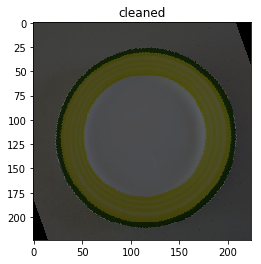

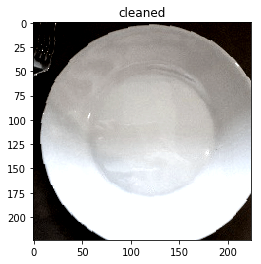

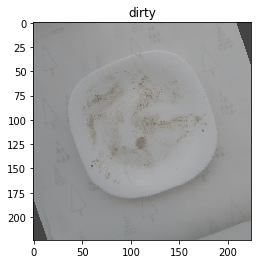

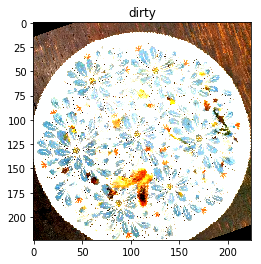

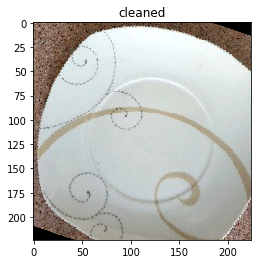

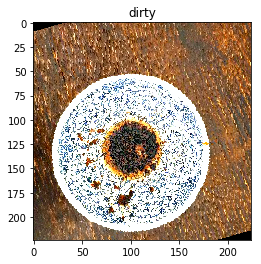

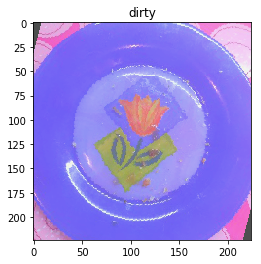

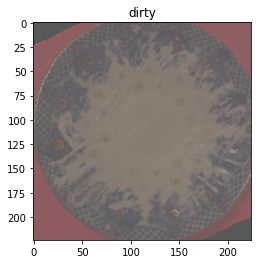

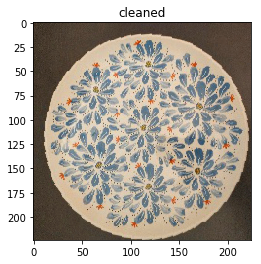

Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 240, in _feed
    send_bytes(obj)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 200, in send_bytes
    self._send_bytes(m[offset:offset + size])
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, buf)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 404, in _send_bytes
    self._send(header + buf)
BrokenPipeError: [Errno 32] Broken pipe
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 368, in _send
    n = write(self._handle, b

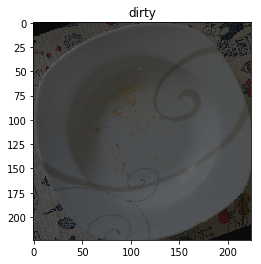

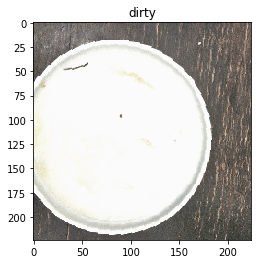

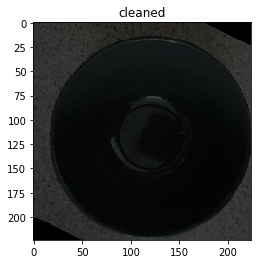

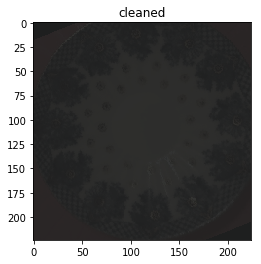

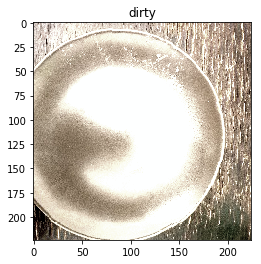

...

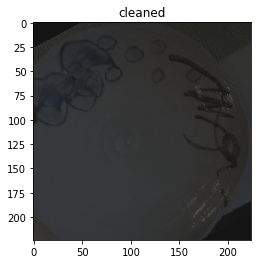

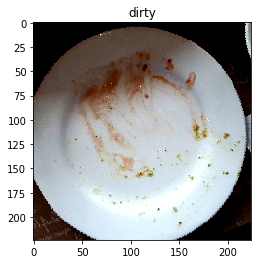

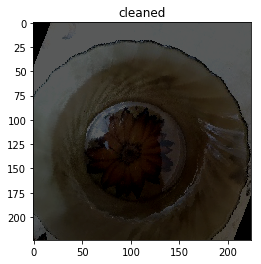

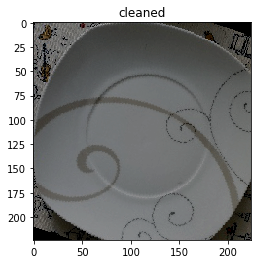

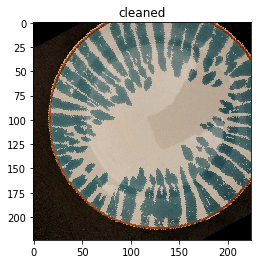

In [21]:
#%%

batch_size = 20
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)

X_batch, y_batch = next(iter(train_dataloader))
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
# денормализация векторов для печати
plt.imshow(X_batch[0].permute(1, 2, 0).numpy() * std + mean);

#%%

def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

X_batch, y_batch = next(iter(train_dataloader))

for x_item, y_item in zip(X_batch, y_batch):
    show_input(x_item, title=class_names[y_item])

In [0]:
def make_resnext101_32x8d():
    model = models.resnext101_32x8d(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )

    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

In [0]:
# pretrained=True сеть уже пред-тренерована на гугловом имадже-нете
def make_resnet152():
    model = models.resnet152(pretrained=True)
    model.fc = nn.Sequential(
        nn.BatchNorm1d(model.fc.in_features),
        nn.Linear(model.fc.in_features, 100),
        nn.BatchNorm1d(100),
        nn.ELU(),
        nn.Linear(100, 2)
    )
    
    passed, muted = {}, {}
    for name, child in model.named_children():
        if name in ['layer4', 'avgpool', 'fc']:
            if name not in passed:
                passed[name] = 0
            for (i,param) in enumerate(child.parameters()):
                passed[name] += 1
                
        elif name == 'layer3':
            for chName, chChild in child.named_children():
                if name not in muted:
                    muted[name] = 0
                if int(chName) not in [32, 33, 34, 35]:
                    for (i,param) in enumerate(chChild.parameters()):
                        param.requires_grad = False         
                        muted[name] += 1
                else:
                    if name not in passed:
                        passed[name] = 0
                    for (i,param) in enumerate(chChild.parameters()):       
                        passed[name] += 1
        else:
            if name not in muted:
                muted[name] = 0
            for (i,param) in enumerate(child.parameters()):
                param.requires_grad = False         
                muted[name] += 1
    
    sum_muted, sum_passed = 0, 0
    for k, v in muted.items():
        sum_muted += v
    for k, v in passed.items():
        sum_passed += v
    
    print(muted, passed)
    print('total muted:', sum_muted, 'total passed:', sum_passed)
    return model

In [0]:
t1 = torch.tensor([1,2,3,4])
t2 = torch.tensor([1,2,5,4])
for (i, el) in enumerate(t1):
    print(el, t2[i])

cmp = (t1 == t2)
for (i, el) in enumerate(cmp):
    if el == 1:
        print(el)

print(cmp.float().mean())

tensor(1) tensor(1)
tensor(2) tensor(2)
tensor(3) tensor(5)
tensor(4) tensor(4)
tensor(1, dtype=torch.uint8)
tensor(1, dtype=torch.uint8)
tensor(1, dtype=torch.uint8)
tensor(0.7500)


In [0]:
class EpochModel():
    def __init__(self, train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device):
        self.train_dataloader = train_dataloader
        self.val_dataloader = val_dataloader
        self.model = model
        self.loss = loss
        self.optimizer = optimizer
        self.scheduler = scheduler
        
        self.device = device
        
        self.train_ac_history = []
        self.val_ac_history = []

        self.fail_cmp_stats = {}
        for i in range(0, val_examples):
             self.fail_cmp_stats[i] = 0
        
    def train(self, num_epochs, train_phases=None):
        if train_phases is None:
            train_phases = [self._epoch_train, self._epoch_validate]
        for epoch in range(num_epochs):
            print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)
            # Each epoch has a training and validation phase
            for phase in train_phases:
                phase()
        return model

    def _print_log(self, phase, epoch_loss, epoch_acc):
        print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)
    
    def _epoch_validate(self):
        self.model.eval()

        running_loss = 0.
        running_acc = 0.
        running_acc_m = 0.

        i_acc = 0
        for inputs, labels in tqdm(self.val_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(False):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)

            running_loss += loss_value.item()
            running_acc = (preds_class == labels.data)
            running_acc_m += running_acc.float().mean()

            for run_acc_item in running_acc:
                if run_acc_item == 0:
                    self.fail_cmp_stats[i_acc] += 1
                i_acc += 1
        
        epoch_loss = running_loss / len(self.val_dataloader)
        epoch_acc = running_acc_m / len(self.val_dataloader)
        self._print_log('validate', epoch_loss, epoch_acc)
        self.val_ac_history.append(epoch_acc.item())

    def _epoch_train(self):
        self.model.train()

        running_loss = 0.
        running_acc = 0.

        for inputs, labels in tqdm(self.train_dataloader):
            inputs = inputs.to(self.device)
            labels = labels.to(self.device)

            self.optimizer.zero_grad()
            with torch.set_grad_enabled(True):
                preds = self.model(inputs)
                loss_value = self.loss(preds, labels)
                preds_class = preds.argmax(dim=1)
                # train work
                loss_value.backward()
                self.optimizer.step()

            running_loss += loss_value.item()
            running_acc += (preds_class == labels.data).float().mean()

        epoch_loss = running_loss / len(self.train_dataloader)
        epoch_acc = running_acc / len(self.train_dataloader)

        # train work
        self.scheduler.step(epoch_loss)

        self._print_log('train', epoch_loss, epoch_acc)
        self.train_ac_history.append(epoch_acc.item())

In [28]:
batch_size = 8

train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)
len(train_dataloader), len(train_dataloader)
            

tme_history = []
for i in range(0,10):
    torch.backends.cudnn.deterministic = True
    torch.cuda.manual_seed(i)
    np.random.seed(i)
    torch.manual_seed(i)

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = make_resnext101_32x8d().to(device)

    for _ in [1]:
        loss = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.Adamax(model.parameters(), lr=.005)

        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, verbose=True)

        tme = EpochModel(train_dataloader, val_dataloader, model, loss, optimizer, scheduler, device)
        tme_history.append(tme)
        tme.train(200)

{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.01s/it]

 40%|████      | 2/5 [00:01<00:02,  1.21it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.46it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.70it/s]

100%|██████████| 5/5 [00:02<00:00,  1.92it/s]



train Loss: 0.7606 Acc: 0.5250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.37it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 69.6677 Acc: 0.5833
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.5245 Acc: 0.7750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 4.9232 Acc: 0.5833
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.5315 Acc: 0.7750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 3.7050 Acc: 0.5833
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.3919 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 2.0987 Acc: 0.5833
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.3490 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 1.0111 Acc: 0.5833
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.3010 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3876 Acc: 0.8750
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.3906 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3902 Acc: 0.7917
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1836 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.4991 Acc: 0.6875
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.1417 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2436 Acc: 0.9375
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.4010 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.10it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.41it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.70it/s]

100%|██████████| 6/6 [00:01<00:00,  3.22it/s]



validate Loss: 0.2136 Acc: 0.9250
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.1806 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2873 Acc: 0.8708
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1757 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3660 Acc: 0.8500
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1493 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3738 Acc: 0.8500
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.1079 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2385 Acc: 0.9250
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1620 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1913 Acc: 0.9583
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0569 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2833 Acc: 0.8125
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1641 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1969 Acc: 0.9375
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1168 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1653 Acc: 0.9792
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0531 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1941 Acc: 0.9458
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0400 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2994 Acc: 0.8708
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0266 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3811 Acc: 0.8500
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.50it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.18it/s]



train Loss: 0.1276 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3639 Acc: 0.8500
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0204 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3365 Acc: 0.8500
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0859 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2564 Acc: 0.8917
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0444 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1814 Acc: 0.9125
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0747 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1759 Acc: 0.9167
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0649 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1812 Acc: 0.9167
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0171 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1891 Acc: 0.9375
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.2430 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2318 Acc: 0.9375
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0378 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2815 Acc: 0.9167
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1844 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2869 Acc: 0.9167
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1029 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2460 Acc: 0.9042
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0657 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2362 Acc: 0.8708
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0755 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2643 Acc: 0.8750
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1683 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2232 Acc: 0.9167
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0229 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2139 Acc: 0.8708
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1547 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2197 Acc: 0.8917
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0316 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2639 Acc: 0.8708
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    38: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0576 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3489 Acc: 0.8708
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0151 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3698 Acc: 0.8708
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0378 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3675 Acc: 0.8708
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0544 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3437 Acc: 0.8708
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0630 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.3368 Acc: 0.8708
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0248 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3117 Acc: 0.8708
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1489 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.19it/s]



validate Loss: 0.3178 Acc: 0.8708
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0326 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2982 Acc: 0.8708
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0274 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3023 Acc: 0.8708
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1018 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2866 Acc: 0.8708
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.4824 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2941 Acc: 0.8708
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0856 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2994 Acc: 0.8708
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    50: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0702 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2976 Acc: 0.8708
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0220 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2833 Acc: 0.8708
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.37it/s]

 40%|████      | 2/5 [00:01<00:01,  1.62it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.07it/s]

100%|██████████| 5/5 [00:02<00:00,  2.25it/s]



train Loss: 0.1814 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3139 Acc: 0.8708
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0255 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.3016 Acc: 0.8708
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3288 Acc: 0.8708
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0538 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3242 Acc: 0.8708
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0303 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3042 Acc: 0.8708
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0798 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3080 Acc: 0.8708
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1008 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.73it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.37it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.3020 Acc: 0.8708
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0313 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3136 Acc: 0.8708
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2850 Acc: 0.8708
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.0274 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2868 Acc: 0.8708
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0203 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2879 Acc: 0.8708
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0249 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3014 Acc: 0.8708
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0164 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2943 Acc: 0.8708
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1596 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3068 Acc: 0.8708
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0322 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3138 Acc: 0.8708
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0602 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3027 Acc: 0.8708
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0709 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3139 Acc: 0.8708
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0457 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3397 Acc: 0.8708
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0941 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3378 Acc: 0.8708
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



Epoch    71: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.2509 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3168 Acc: 0.8708
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0842 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3128 Acc: 0.8708
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0492 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3164 Acc: 0.8708
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0224 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3169 Acc: 0.8708
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0546 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.3266 Acc: 0.8708
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0524 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2990 Acc: 0.8708
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0155 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3048 Acc: 0.8708
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1823 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2930 Acc: 0.8708
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0206 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3071 Acc: 0.8708
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.1220 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.81it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.12it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.44it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.72it/s]

100%|██████████| 6/6 [00:01<00:00,  3.23it/s]



validate Loss: 0.2932 Acc: 0.8708
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0220 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2919 Acc: 0.8708
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0111 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2937 Acc: 0.8708
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0243 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2910 Acc: 0.8708
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0165 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3008 Acc: 0.8708
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0238 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.3163 Acc: 0.8708
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0165 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2948 Acc: 0.8708
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1728 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2885 Acc: 0.8708
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0133 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2963 Acc: 0.8708
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0174 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3082 Acc: 0.8708
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0250 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3113 Acc: 0.8708
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0304 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2951 Acc: 0.8708
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0506 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3221 Acc: 0.8708
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



Epoch    93: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.4375 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3115 Acc: 0.8708
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1435 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3238 Acc: 0.8708
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0238 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.3112 Acc: 0.8708
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0324 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3017 Acc: 0.8708
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0497 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3216 Acc: 0.8708
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0192 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3101 Acc: 0.8708
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0225 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2771 Acc: 0.8708
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0239 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2896 Acc: 0.8708
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0297 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3007 Acc: 0.8708
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2929 Acc: 0.8708
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1280 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2911 Acc: 0.8708
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



Epoch   104: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.1203 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2876 Acc: 0.8708
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0163 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2712 Acc: 0.8708
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0656 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2682 Acc: 0.8708
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0242 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3027 Acc: 0.8708
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0317 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2926 Acc: 0.8708
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0405 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2922 Acc: 0.8708
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0357 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2948 Acc: 0.8708
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0552 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2811 Acc: 0.8708
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0562 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.2936 Acc: 0.8708
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.35it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0249 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2847 Acc: 0.8708
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0602 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3134 Acc: 0.8708
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



Epoch   115: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0455 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3050 Acc: 0.8708
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0310 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2934 Acc: 0.8708
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0311 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2997 Acc: 0.8708
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1810 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3034 Acc: 0.8708
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0284 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2801 Acc: 0.8708
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2730 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.2857 Acc: 0.8708
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0293 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.3011 Acc: 0.8708
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0483 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3214 Acc: 0.8708
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0258 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3012 Acc: 0.8708
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0198 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3020 Acc: 0.8708
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0554 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2799 Acc: 0.8708
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1857 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3014 Acc: 0.8708
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.9320 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3060 Acc: 0.8708
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1423 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3088 Acc: 0.8708
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0180 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.3084 Acc: 0.8708
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.58it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.82it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.03it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0358 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3145 Acc: 0.8708
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0434 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3045 Acc: 0.8708
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0186 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3074 Acc: 0.8708
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0349 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2941 Acc: 0.8708
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0237 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2883 Acc: 0.8708
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0239 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2928 Acc: 0.8708
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.3324 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2880 Acc: 0.8708
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0758 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3036 Acc: 0.8708
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1975 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.48it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.3210 Acc: 0.8708
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0420 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3170 Acc: 0.8708
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0119 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3239 Acc: 0.8708
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0857 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3089 Acc: 0.8708
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0370 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2922 Acc: 0.8708
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.2036 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2945 Acc: 0.8708
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0116 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3004 Acc: 0.8708
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3014 Acc: 0.8708
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0172 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2938 Acc: 0.8708
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0166 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2891 Acc: 0.8708
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0198 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2758 Acc: 0.8708
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0128 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2807 Acc: 0.8708
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0607 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2977 Acc: 0.8708
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0647 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3071 Acc: 0.8708
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.97it/s]

100%|██████████| 5/5 [00:02<00:00,  2.17it/s]



train Loss: 0.1338 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3061 Acc: 0.8708
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0262 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3219 Acc: 0.8708
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1406 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3065 Acc: 0.8708
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0452 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2915 Acc: 0.8708
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0139 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2907 Acc: 0.8708
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0949 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2807 Acc: 0.8708
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0266 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.54it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.81it/s]

100%|██████████| 6/6 [00:01<00:00,  3.32it/s]



validate Loss: 0.3118 Acc: 0.8708
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0110 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3026 Acc: 0.8708
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0628 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:01<00:00,  3.12it/s]



validate Loss: 0.2975 Acc: 0.8708
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0305 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3096 Acc: 0.8708
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0304 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2869 Acc: 0.8708
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1081 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2847 Acc: 0.8708
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0176 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2915 Acc: 0.8708
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0614 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3217 Acc: 0.8708
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0289 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.2761 Acc: 0.8708
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0495 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3047 Acc: 0.8708
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0150 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2836 Acc: 0.8708
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0579 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2904 Acc: 0.8708
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0299 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2996 Acc: 0.8708
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.1373 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.65it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2912 Acc: 0.8708
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2940 Acc: 0.8708
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1143 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2831 Acc: 0.8708
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0570 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3038 Acc: 0.8708
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1809 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3027 Acc: 0.8708
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0213 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2867 Acc: 0.8708
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0144 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2842 Acc: 0.8708
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0414 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2919 Acc: 0.8708
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2748 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3092 Acc: 0.8708
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0734 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3269 Acc: 0.8708
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0312 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3455 Acc: 0.8708
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0150 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3135 Acc: 0.8708
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0300 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3093 Acc: 0.8708
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0716 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3082 Acc: 0.8708
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.1840 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.3272 Acc: 0.8708
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0221 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3224 Acc: 0.8708
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0898 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3148 Acc: 0.8708
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0268 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3138 Acc: 0.8708
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0934 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3196 Acc: 0.8708
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0668 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2948 Acc: 0.8708
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0137 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2884 Acc: 0.8708
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0332 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2830 Acc: 0.8708
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0242 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2732 Acc: 0.8708
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1821 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2875 Acc: 0.8708
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3201 Acc: 0.8708
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.1244 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2938 Acc: 0.8708
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1010 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3020 Acc: 0.8708
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0307 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3346 Acc: 0.8708
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1344 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3386 Acc: 0.8708
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.02s/it]

 40%|████      | 2/5 [00:01<00:02,  1.21it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.46it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.70it/s]

100%|██████████| 5/5 [00:02<00:00,  1.92it/s]



train Loss: 0.9277 Acc: 0.5750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.10it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.38it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.70it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.02it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  2.34it/s]

100%|██████████| 6/6 [00:02<00:00,  2.85it/s]



validate Loss: 368.5820 Acc: 0.5833
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.6491 Acc: 0.6500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 37.7288 Acc: 0.4167
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.4194 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 11.6797 Acc: 0.4167
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.4464 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 1.2897 Acc: 0.3958
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.3108 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.5377 Acc: 0.6458
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.2177 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3442 Acc: 0.8333
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1470 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2772 Acc: 0.9375
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2174 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2368 Acc: 0.9583
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.0713 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2299 Acc: 0.9583
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2061 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2330 Acc: 0.9583
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1645 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2117 Acc: 0.9167
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.2234 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2267 Acc: 0.9250
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0869 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2140 Acc: 0.8958
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0940 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2198 Acc: 0.8958
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0920 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2183 Acc: 0.9167
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0350 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2175 Acc: 0.9250
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0240 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2088 Acc: 0.9042
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0564 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1895 Acc: 0.9583
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1378 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1796 Acc: 0.9167
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.3357 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2355 Acc: 0.9167
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.37it/s]

 40%|████      | 2/5 [00:01<00:01,  1.62it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.07it/s]

100%|██████████| 5/5 [00:02<00:00,  2.26it/s]



train Loss: 0.2982 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1737 Acc: 0.9583
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.74it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.17it/s]



train Loss: 0.0394 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1921 Acc: 0.9375
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0884 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2081 Acc: 0.9375
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0634 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1843 Acc: 0.9375
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1013 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1717 Acc: 0.9375
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0246 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1744 Acc: 0.9167
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1990 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1734 Acc: 0.9375
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



Epoch    27: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0980 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1728 Acc: 0.9583
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0277 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1704 Acc: 0.9583
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0986 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1687 Acc: 0.9583
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0567 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1721 Acc: 0.9583
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2736 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1670 Acc: 0.9583
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2511 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1693 Acc: 0.9375
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2376 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1631 Acc: 0.9583
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0753 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1726 Acc: 0.9583
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0435 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1750 Acc: 0.9583
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1930 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1637 Acc: 0.9583
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1869 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1599 Acc: 0.9583
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



Epoch    38: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.1344 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1633 Acc: 0.9583
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0369 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1732 Acc: 0.9583
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0770 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1641 Acc: 0.9167
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0330 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1659 Acc: 0.9167
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0228 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1654 Acc: 0.9167
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0430 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1618 Acc: 0.9375
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0351 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.1597 Acc: 0.9375
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1329 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1630 Acc: 0.9167
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0581 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1602 Acc: 0.9167
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0445 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1617 Acc: 0.9375
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0203 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1630 Acc: 0.9167
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0533 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.94it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.53it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.79it/s]

100%|██████████| 6/6 [00:01<00:00,  3.31it/s]



validate Loss: 0.1694 Acc: 0.9167
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0424 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1619 Acc: 0.9167
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0307 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1638 Acc: 0.9167
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0410 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1665 Acc: 0.9375
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2224 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1530 Acc: 0.9375
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0262 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1573 Acc: 0.9167
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0283 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1606 Acc: 0.9375
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1076 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1560 Acc: 0.9167
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0420 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1601 Acc: 0.9583
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0587 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1607 Acc: 0.9167
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



Epoch    59: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0592 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1638 Acc: 0.9583
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0498 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1586 Acc: 0.9375
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0549 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1686 Acc: 0.9583
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0460 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1674 Acc: 0.9583
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0216 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1721 Acc: 0.9583
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1198 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1717 Acc: 0.9583
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0404 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1645 Acc: 0.9375
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0445 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1636 Acc: 0.9375
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1540 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1610 Acc: 0.9375
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0823 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1619 Acc: 0.9167
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0444 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1583 Acc: 0.9167
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.74it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



Epoch    70: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0457 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1611 Acc: 0.9375
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1133 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1613 Acc: 0.9375
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.2297 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1618 Acc: 0.9583
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0564 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1629 Acc: 0.9583
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0596 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.18it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.49it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.28it/s]



validate Loss: 0.1658 Acc: 0.9583
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1210 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.09it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.41it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.70it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.1548 Acc: 0.9583
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0292 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1618 Acc: 0.9583
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0343 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1612 Acc: 0.9167
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0181 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1603 Acc: 0.9375
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0381 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1662 Acc: 0.9583
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0530 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1656 Acc: 0.9583
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0786 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1705 Acc: 0.9583
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0268 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.1693 Acc: 0.9583
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1399 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1658 Acc: 0.9583
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0170 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1659 Acc: 0.9375
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0397 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1694 Acc: 0.9375
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0481 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1642 Acc: 0.9167
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.2152 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.13it/s]



validate Loss: 0.1599 Acc: 0.9167
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0256 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1590 Acc: 0.9167
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0327 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1581 Acc: 0.9167
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.1417 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.20it/s]



validate Loss: 0.1607 Acc: 0.9583
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0169 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1583 Acc: 0.9167
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0404 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1615 Acc: 0.9375
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1424 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1568 Acc: 0.9167
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1584 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.08it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.1503 Acc: 0.9167
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0232 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1621 Acc: 0.9583
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1035 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1630 Acc: 0.9583
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0940 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1618 Acc: 0.9583
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2107 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1588 Acc: 0.9167
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0338 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1622 Acc: 0.9167
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0610 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1591 Acc: 0.9167
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1792 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1511 Acc: 0.9167
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



Epoch   102: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0811 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1574 Acc: 0.9375
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1503 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1560 Acc: 0.9375
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0796 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.1590 Acc: 0.9167
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0253 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1629 Acc: 0.9375
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0275 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1695 Acc: 0.9583
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0309 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1637 Acc: 0.9583
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0286 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1605 Acc: 0.9375
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.17it/s]



train Loss: 0.0326 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.53it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.79it/s]

100%|██████████| 6/6 [00:01<00:00,  3.29it/s]



validate Loss: 0.1629 Acc: 0.9375
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0219 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.65it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1624 Acc: 0.9167
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.3019 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1543 Acc: 0.9375
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0312 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1611 Acc: 0.9583
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



Epoch   113: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0388 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.65it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1567 Acc: 0.9167
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0561 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1617 Acc: 0.9583
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0492 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1636 Acc: 0.9583
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1194 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1630 Acc: 0.9583
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0304 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1631 Acc: 0.9583
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0287 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.13it/s]



validate Loss: 0.1661 Acc: 0.9583
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0552 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1635 Acc: 0.9375
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1002 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1619 Acc: 0.9167
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0295 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1638 Acc: 0.9167
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0264 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.10it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.42it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.70it/s]

100%|██████████| 6/6 [00:01<00:00,  3.22it/s]



validate Loss: 0.1608 Acc: 0.9167
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0839 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1579 Acc: 0.9167
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0773 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1610 Acc: 0.9583
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0267 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1617 Acc: 0.9375
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2485 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1596 Acc: 0.9375
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1859 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1558 Acc: 0.9375
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0201 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1598 Acc: 0.9583
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0199 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1584 Acc: 0.9375
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0992 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1644 Acc: 0.9583
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0445 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1610 Acc: 0.9583
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0239 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1703 Acc: 0.9583
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0459 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1624 Acc: 0.9375
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1116 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1577 Acc: 0.9375
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0805 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1596 Acc: 0.9583
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0294 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1594 Acc: 0.9375
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0273 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1693 Acc: 0.9583
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.32it/s]

 40%|████      | 2/5 [00:01<00:01,  1.57it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.82it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0197 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1712 Acc: 0.9583
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2929 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1707 Acc: 0.9583
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0432 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1682 Acc: 0.9583
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0222 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1744 Acc: 0.9583
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0653 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1712 Acc: 0.9583
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0414 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.08it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.20it/s]



validate Loss: 0.1656 Acc: 0.9375
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0272 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1667 Acc: 0.9375
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0661 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1648 Acc: 0.9583
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1121 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1746 Acc: 0.9375
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0809 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1827 Acc: 0.9375
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1247 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1660 Acc: 0.9583
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1590 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1547 Acc: 0.9167
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0969 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1567 Acc: 0.9167
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0464 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.1643 Acc: 0.9583
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0341 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1708 Acc: 0.9583
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1003 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1716 Acc: 0.9375
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0199 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1707 Acc: 0.9375
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1226 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1675 Acc: 0.9583
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.0649 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1661 Acc: 0.9583
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1257 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1632 Acc: 0.9583
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0222 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1635 Acc: 0.9167
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0462 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1731 Acc: 0.9583
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1054 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.49it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.28it/s]



validate Loss: 0.1639 Acc: 0.9583
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0574 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1703 Acc: 0.9583
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0516 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1666 Acc: 0.9583
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0192 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1624 Acc: 0.9375
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0212 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1662 Acc: 0.9583
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0193 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1679 Acc: 0.9583
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0516 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1596 Acc: 0.9375
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0702 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1571 Acc: 0.9375
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0168 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.1627 Acc: 0.9583
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0215 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1675 Acc: 0.9583
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0657 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1620 Acc: 0.9583
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0607 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1582 Acc: 0.9167
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.41it/s]

 40%|████      | 2/5 [00:01<00:01,  1.65it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.10it/s]

100%|██████████| 5/5 [00:02<00:00,  2.28it/s]



train Loss: 0.1161 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1613 Acc: 0.9583
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0331 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1623 Acc: 0.9583
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0166 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.45it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.09it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.40it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.69it/s]

100%|██████████| 6/6 [00:01<00:00,  3.20it/s]



validate Loss: 0.1640 Acc: 0.9583
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0437 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1682 Acc: 0.9583
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0246 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1769 Acc: 0.9583
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1955 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1771 Acc: 0.9375
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0984 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.1714 Acc: 0.9583
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0275 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1775 Acc: 0.9375
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0157 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1682 Acc: 0.9583
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0411 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1604 Acc: 0.9375
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0404 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1679 Acc: 0.9583
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.1500 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1631 Acc: 0.9583
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0261 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1581 Acc: 0.9167
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.25it/s]

 40%|████      | 2/5 [00:01<00:01,  1.51it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.19it/s]



train Loss: 0.0432 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1611 Acc: 0.9583
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0291 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.09it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.40it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.19it/s]



validate Loss: 0.1686 Acc: 0.9583
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1660 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1653 Acc: 0.9583
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0141 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1663 Acc: 0.9583
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1325 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1554 Acc: 0.9375
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0261 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1584 Acc: 0.9167
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0364 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1673 Acc: 0.9583
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0170 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1687 Acc: 0.9583
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0347 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1687 Acc: 0.9375
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0176 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1715 Acc: 0.9583
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0417 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.1757 Acc: 0.9583
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0278 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1800 Acc: 0.9375
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0941 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.1781 Acc: 0.9375
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1012 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1721 Acc: 0.9375
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0235 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1654 Acc: 0.9583
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:06,  1.63s/it]

 40%|████      | 2/5 [00:02<00:03,  1.26s/it]

 60%|██████    | 3/5 [00:02<00:01,  1.01it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.24it/s]

100%|██████████| 5/5 [00:03<00:00,  1.49it/s]



train Loss: 0.8374 Acc: 0.6500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:01<00:08,  1.61s/it]

 33%|███▎      | 2/6 [00:02<00:05,  1.27s/it]

 50%|█████     | 3/6 [00:02<00:02,  1.03it/s]

 67%|██████▋   | 4/6 [00:02<00:01,  1.31it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  1.62it/s]

100%|██████████| 6/6 [00:03<00:00,  2.06it/s]



validate Loss: 1965.5140 Acc: 0.4167
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.6316 Acc: 0.6500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 31.3682 Acc: 0.4167
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.4736 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 1.7109 Acc: 0.4167
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.4055 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.4720 Acc: 0.8833
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.3422 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3673 Acc: 0.8625
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2317 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3069 Acc: 0.9042
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.17it/s]



train Loss: 0.2753 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2940 Acc: 0.9583
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1115 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2980 Acc: 0.8750
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1583 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3793 Acc: 0.7917
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.1250 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.4959 Acc: 0.7083
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.3749 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2911 Acc: 0.8750
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2165 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3368 Acc: 0.7917
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1820 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3797 Acc: 0.7917
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0693 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.4118 Acc: 0.7917
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0933 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4358 Acc: 0.7500
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1012 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.4119 Acc: 0.7917
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1107 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.92it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.54it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.81it/s]

100%|██████████| 6/6 [00:01<00:00,  3.33it/s]



validate Loss: 0.4140 Acc: 0.7917
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1622 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3974 Acc: 0.8125
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0983 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3788 Acc: 0.8125
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0409 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2561 Acc: 0.8958
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0430 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2393 Acc: 0.9583
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.74it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.1857 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2280 Acc: 0.9375
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.39it/s]

 40%|████      | 2/5 [00:01<00:01,  1.64it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.88it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.09it/s]

100%|██████████| 5/5 [00:02<00:00,  2.27it/s]



train Loss: 0.1946 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2526 Acc: 0.8958
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0823 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3053 Acc: 0.8750
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.1871 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3084 Acc: 0.8750
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0938 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3195 Acc: 0.8333
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0609 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2858 Acc: 0.8750
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0229 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2833 Acc: 0.8750
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0379 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2593 Acc: 0.8958
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0605 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2470 Acc: 0.8833
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0132 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2744 Acc: 0.8417
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0605 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2573 Acc: 0.8417
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0567 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2270 Acc: 0.8833
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0060 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2326 Acc: 0.8500
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0323 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2231 Acc: 0.8500
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0104 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.49it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.13it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.44it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.71it/s]

100%|██████████| 6/6 [00:01<00:00,  3.24it/s]



validate Loss: 0.2391 Acc: 0.8500
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1092 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2449 Acc: 0.8958
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0266 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2842 Acc: 0.8542
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0086 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.2886 Acc: 0.8750
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1907 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3020 Acc: 0.8500
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0423 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.21it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.51it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.78it/s]

100%|██████████| 6/6 [00:01<00:00,  3.30it/s]



validate Loss: 0.2757 Acc: 0.8500
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0124 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2451 Acc: 0.8833
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0119 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2279 Acc: 0.8958
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2135 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2502 Acc: 0.8750
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    44: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0365 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3021 Acc: 0.8542
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0229 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.3253 Acc: 0.8125
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0200 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3754 Acc: 0.7917
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1657 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3242 Acc: 0.8125
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0859 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3508 Acc: 0.8125
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.97it/s]

100%|██████████| 5/5 [00:02<00:00,  2.17it/s]



train Loss: 0.2122 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3769 Acc: 0.8125
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0082 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4148 Acc: 0.7917
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0101 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4291 Acc: 0.7708
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1083 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.4405 Acc: 0.7708
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0499 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.4091 Acc: 0.7917
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0697 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3822 Acc: 0.7917
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.28it/s]

 40%|████      | 2/5 [00:01<00:01,  1.53it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.78it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.01it/s]

100%|██████████| 5/5 [00:02<00:00,  2.20it/s]



Epoch    55: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3222 Acc: 0.8542
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0075 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3124 Acc: 0.8333
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1298 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3322 Acc: 0.8333
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0366 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3061 Acc: 0.8542
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0131 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3182 Acc: 0.8542
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0229 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3099 Acc: 0.8542
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0496 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2954 Acc: 0.8542
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0625 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2775 Acc: 0.8542
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0073 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2755 Acc: 0.8542
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1279 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2713 Acc: 0.8542
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0222 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2858 Acc: 0.8542
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



Epoch    66: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0084 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2922 Acc: 0.8542
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1236 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2773 Acc: 0.8542
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0716 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2920 Acc: 0.8542
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0213 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3117 Acc: 0.8542
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0112 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3027 Acc: 0.8542
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0081 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2878 Acc: 0.8542
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0230 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3057 Acc: 0.8542
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1135 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.50it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.75it/s]

100%|██████████| 6/6 [00:01<00:00,  3.26it/s]



validate Loss: 0.2763 Acc: 0.8542
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0186 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.21it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.50it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.28it/s]



validate Loss: 0.2874 Acc: 0.8542
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0274 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2849 Acc: 0.8542
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0193 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3036 Acc: 0.8542
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    77: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0206 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2858 Acc: 0.8542
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.40it/s]

 40%|████      | 2/5 [00:01<00:01,  1.65it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.89it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.10it/s]

100%|██████████| 5/5 [00:02<00:00,  2.28it/s]



train Loss: 0.0935 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2803 Acc: 0.8542
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0108 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2877 Acc: 0.8542
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1612 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2821 Acc: 0.8542
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0645 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2884 Acc: 0.8542
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0372 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2797 Acc: 0.8542
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0148 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2819 Acc: 0.8542
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0106 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2854 Acc: 0.8542
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0290 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.2875 Acc: 0.8542
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0190 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2843 Acc: 0.8542
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0154 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2789 Acc: 0.8542
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    88: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0458 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2735 Acc: 0.8542
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0338 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2762 Acc: 0.8542
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0195 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2644 Acc: 0.8542
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0344 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2876 Acc: 0.8542
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0195 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3048 Acc: 0.8333
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1107 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.3077 Acc: 0.8542
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.38it/s]

 40%|████      | 2/5 [00:01<00:01,  1.63it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.08it/s]

100%|██████████| 5/5 [00:02<00:00,  2.26it/s]



train Loss: 0.0234 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3057 Acc: 0.8542
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1245 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.3060 Acc: 0.8333
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0268 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2960 Acc: 0.8542
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0285 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3001 Acc: 0.8542
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0409 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2882 Acc: 0.8542
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    99: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0081 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2802 Acc: 0.8542
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0084 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2912 Acc: 0.8542
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0169 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2937 Acc: 0.8542
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0192 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2795 Acc: 0.8542
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0405 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2731 Acc: 0.8542
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0146 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2853 Acc: 0.8542
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0166 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.14it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.44it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.71it/s]

100%|██████████| 6/6 [00:01<00:00,  3.23it/s]



validate Loss: 0.3038 Acc: 0.8542
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.30it/s]

 40%|████      | 2/5 [00:01<00:01,  1.55it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.80it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.02it/s]

100%|██████████| 5/5 [00:02<00:00,  2.22it/s]



train Loss: 0.0385 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2919 Acc: 0.8542
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0943 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3218 Acc: 0.8333
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1022 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3086 Acc: 0.8333
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0131 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3257 Acc: 0.8333
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0174 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.3101 Acc: 0.8542
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0354 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3160 Acc: 0.8333
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0453 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2715 Acc: 0.8542
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0189 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2770 Acc: 0.8542
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0655 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2671 Acc: 0.8750
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1151 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2876 Acc: 0.8542
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0292 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2725 Acc: 0.8542
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0369 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2834 Acc: 0.8542
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0211 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2855 Acc: 0.8542
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2293 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2667 Acc: 0.8750
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2350 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2873 Acc: 0.8542
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0545 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2722 Acc: 0.8750
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0322 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.2821 Acc: 0.8542
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0075 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2842 Acc: 0.8542
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0120 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2700 Acc: 0.8750
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0457 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2628 Acc: 0.8958
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.5392 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2681 Acc: 0.8542
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.5980 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.2632 Acc: 0.8542
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0685 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.65it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.2708 Acc: 0.8958
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0206 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.2714 Acc: 0.8750
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0125 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2844 Acc: 0.8750
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0313 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.2929 Acc: 0.8542
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0210 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2878 Acc: 0.8542
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0360 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2795 Acc: 0.8542
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0288 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2980 Acc: 0.8542
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0537 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3170 Acc: 0.8542
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0464 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3209 Acc: 0.8333
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0131 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3178 Acc: 0.8333
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0325 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.3192 Acc: 0.8333
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0298 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3005 Acc: 0.8542
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0164 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.3060 Acc: 0.8542
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0114 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2985 Acc: 0.8542
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0302 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3122 Acc: 0.8333
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0197 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3343 Acc: 0.8333
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2875 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.48it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.80it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.12it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.42it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.3069 Acc: 0.8542
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0085 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3035 Acc: 0.8542
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1667 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3160 Acc: 0.8333
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0369 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3050 Acc: 0.8333
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2012 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2949 Acc: 0.8542
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0490 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2666 Acc: 0.8958
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.29it/s]

 40%|████      | 2/5 [00:01<00:01,  1.53it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.77it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.99it/s]

100%|██████████| 5/5 [00:02<00:00,  2.19it/s]



train Loss: 0.0173 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2948 Acc: 0.8542
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0405 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2985 Acc: 0.8542
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0086 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2911 Acc: 0.8542
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0169 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2867 Acc: 0.8542
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0194 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2980 Acc: 0.8542
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0111 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2747 Acc: 0.8750
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0187 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2738 Acc: 0.8542
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0168 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2913 Acc: 0.8542
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0114 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3000 Acc: 0.8333
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0156 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2970 Acc: 0.8542
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0353 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2737 Acc: 0.8542
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0480 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2721 Acc: 0.8542
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0091 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.12it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.42it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.69it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.2820 Acc: 0.8542
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0940 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2871 Acc: 0.8750
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0125 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.2985 Acc: 0.8542
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0103 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3020 Acc: 0.8542
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0327 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3010 Acc: 0.8542
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0919 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.2971 Acc: 0.8542
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0685 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2987 Acc: 0.8542
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0579 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2837 Acc: 0.8750
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1027 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3205 Acc: 0.8333
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0971 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3089 Acc: 0.8542
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0526 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2797 Acc: 0.8542
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0138 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.2745 Acc: 0.8542
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0247 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2758 Acc: 0.8542
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.26it/s]

 40%|████      | 2/5 [00:01<00:01,  1.51it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.76it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.18it/s]



train Loss: 0.0211 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2667 Acc: 0.8750
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.6674 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.2965 Acc: 0.8542
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0645 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2889 Acc: 0.8542
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0102 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.2704 Acc: 0.8542
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0119 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2725 Acc: 0.8542
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0152 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2613 Acc: 0.8750
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0158 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2684 Acc: 0.8750
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1642 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3005 Acc: 0.8542
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0444 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3090 Acc: 0.8542
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0278 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.47it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.75it/s]

100%|██████████| 6/6 [00:01<00:00,  3.26it/s]



validate Loss: 0.2801 Acc: 0.8542
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0400 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2968 Acc: 0.8333
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0678 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2746 Acc: 0.8542
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0312 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.11it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.43it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.69it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.2836 Acc: 0.8542
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0088 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.2914 Acc: 0.8542
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0146 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2755 Acc: 0.8750
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0640 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2797 Acc: 0.8542
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0261 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2824 Acc: 0.8542
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0485 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2788 Acc: 0.8542
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0180 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2908 Acc: 0.8542
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0302 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.2850 Acc: 0.8542
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0080 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.11it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.42it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.70it/s]

100%|██████████| 6/6 [00:01<00:00,  3.22it/s]



validate Loss: 0.2820 Acc: 0.8542
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0154 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2821 Acc: 0.8542
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0074 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2912 Acc: 0.8542
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0218 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2820 Acc: 0.8542
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0635 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.17it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.46it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.73it/s]

100%|██████████| 6/6 [00:01<00:00,  3.24it/s]



validate Loss: 0.2747 Acc: 0.8542
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.04s/it]

 40%|████      | 2/5 [00:01<00:02,  1.19it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.43it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.67it/s]

100%|██████████| 5/5 [00:02<00:00,  1.90it/s]



train Loss: 1.1138 Acc: 0.3750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.10it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.38it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.70it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.02it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  2.33it/s]

100%|██████████| 6/6 [00:02<00:00,  2.85it/s]



validate Loss: 310.4449 Acc: 0.5833
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.7321 Acc: 0.6500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 2.7255 Acc: 0.5833
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.5377 Acc: 0.7750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.5131 Acc: 0.8333
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.4621 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.6593 Acc: 0.6542
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.3848 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.4704 Acc: 0.7292
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.2810 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3217 Acc: 0.8750
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.2343 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2284 Acc: 0.9583
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1930 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1803 Acc: 0.9792
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.2012 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2197 Acc: 0.8958
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2042 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2483 Acc: 0.9042
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.60it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.06it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.2879 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2419 Acc: 0.8958
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0766 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3136 Acc: 0.8750
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.3164 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2775 Acc: 0.8958
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1576 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1882 Acc: 0.9583
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1471 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1632 Acc: 0.9792
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1015 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1138 Acc: 1.0000
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1801 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1033 Acc: 0.9792
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.26it/s]

 40%|████      | 2/5 [00:01<00:01,  1.51it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.76it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.18it/s]



train Loss: 0.1596 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1078 Acc: 0.9792
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0740 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1166 Acc: 0.9583
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1206 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1219 Acc: 0.9792
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2275 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2487 Acc: 0.8542
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1982 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3213 Acc: 0.8542
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1720 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2330 Acc: 0.8958
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1576 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1771 Acc: 0.8958
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.17it/s]



train Loss: 0.0793 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1419 Acc: 0.9792
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1100 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1564 Acc: 0.9583
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1508 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1579 Acc: 0.9583
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1431 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1951 Acc: 0.8750
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1193 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2206 Acc: 0.8542
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0346 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1806 Acc: 0.8958
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2308 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1383 Acc: 0.9583
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0207 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.1261 Acc: 1.0000
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0563 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1186 Acc: 1.0000
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2788 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1652 Acc: 0.9167
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0402 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2299 Acc: 0.8750
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0824 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2608 Acc: 0.8750
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0675 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1963 Acc: 0.9167
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0541 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1747 Acc: 0.9167
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0547 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1983 Acc: 0.8958
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0452 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2258 Acc: 0.8958
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.3128 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1400 Acc: 0.9583
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0178 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1523 Acc: 0.9458
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0505 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1462 Acc: 0.9250
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0232 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1433 Acc: 0.9458
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1489 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1525 Acc: 0.9458
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.27it/s]

 40%|████      | 2/5 [00:01<00:01,  1.52it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.76it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.18it/s]



train Loss: 0.1410 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1374 Acc: 0.9250
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0235 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1522 Acc: 0.9375
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0258 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1718 Acc: 0.9375
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0776 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2146 Acc: 0.8750
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0194 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2607 Acc: 0.8750
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0144 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2993 Acc: 0.8542
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0194 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.49it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.75it/s]

100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



validate Loss: 0.2714 Acc: 0.8750
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.37it/s]

 40%|████      | 2/5 [00:01<00:01,  1.62it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.08it/s]

100%|██████████| 5/5 [00:02<00:00,  2.27it/s]



train Loss: 0.0086 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2794 Acc: 0.8750
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0694 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2941 Acc: 0.8750
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.31it/s]

 40%|████      | 2/5 [00:01<00:01,  1.56it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.80it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.02it/s]

100%|██████████| 5/5 [00:02<00:00,  2.21it/s]



train Loss: 0.0207 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2776 Acc: 0.8750
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0228 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2381 Acc: 0.8750
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0848 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2050 Acc: 0.8958
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2227 Acc: 0.8542
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2212 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2577 Acc: 0.8542
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1727 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2231 Acc: 0.8958
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0116 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2096 Acc: 0.8958
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0495 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2053 Acc: 0.8958
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.5128 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2178 Acc: 0.8958
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch    63: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0236 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2858 Acc: 0.8750
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0118 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3037 Acc: 0.8750
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0104 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3133 Acc: 0.8750
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0860 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3409 Acc: 0.8542
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0246 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3534 Acc: 0.8542
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0308 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3237 Acc: 0.8750
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0432 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3146 Acc: 0.8750
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2855 Acc: 0.8750
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0180 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2761 Acc: 0.8750
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.5617 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.3088 Acc: 0.8750
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0261 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3189 Acc: 0.8750
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    74: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0124 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2975 Acc: 0.8750
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0161 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2594 Acc: 0.8750
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0282 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2609 Acc: 0.8750
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.2585 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2912 Acc: 0.8750
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0521 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2965 Acc: 0.8750
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1018 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2849 Acc: 0.8750
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0261 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2683 Acc: 0.8750
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0408 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2609 Acc: 0.8750
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0073 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2503 Acc: 0.8958
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0132 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2496 Acc: 0.8750
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1947 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2293 Acc: 0.8958
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0179 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.52it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.78it/s]

100%|██████████| 6/6 [00:01<00:00,  3.28it/s]



validate Loss: 0.2534 Acc: 0.8750
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0525 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2553 Acc: 0.8750
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0362 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2455 Acc: 0.8750
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0530 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2664 Acc: 0.8750
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0543 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.53it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.80it/s]

100%|██████████| 6/6 [00:01<00:00,  3.31it/s]



validate Loss: 0.2607 Acc: 0.8750
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0239 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.65it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.2713 Acc: 0.8750
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0146 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2644 Acc: 0.8750
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0465 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2656 Acc: 0.8750
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    93: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0094 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2476 Acc: 0.8750
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0099 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2578 Acc: 0.8750
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0198 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2403 Acc: 0.8750
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0484 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2530 Acc: 0.8750
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0107 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2507 Acc: 0.8750
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0324 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2407 Acc: 0.8958
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.42it/s]

 40%|████      | 2/5 [00:01<00:01,  1.67it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.91it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.12it/s]

100%|██████████| 5/5 [00:02<00:00,  2.30it/s]



train Loss: 0.0092 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2428 Acc: 0.8750
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0089 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2418 Acc: 0.8750
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0364 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.09it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.40it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.19it/s]



validate Loss: 0.2616 Acc: 0.8750
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0428 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2544 Acc: 0.8750
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0414 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2505 Acc: 0.8750
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



Epoch   104: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0083 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2501 Acc: 0.8750
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0442 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2483 Acc: 0.8750
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0095 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2507 Acc: 0.8750
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0488 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2587 Acc: 0.8750
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0640 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2480 Acc: 0.8750
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2172 Acc: 0.8958
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0209 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2403 Acc: 0.8958
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0165 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2580 Acc: 0.8750
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0962 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2852 Acc: 0.8750
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.32it/s]

 40%|████      | 2/5 [00:01<00:01,  1.57it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.81it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.03it/s]

100%|██████████| 5/5 [00:02<00:00,  2.21it/s]



train Loss: 0.0112 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2786 Acc: 0.8750
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0172 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2700 Acc: 0.8750
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



Epoch   115: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0488 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.12it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.43it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.70it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.2634 Acc: 0.8750
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0119 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2706 Acc: 0.8750
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0227 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2648 Acc: 0.8750
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0136 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2911 Acc: 0.8750
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1198 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2565 Acc: 0.8750
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0132 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2662 Acc: 0.8750
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2614 Acc: 0.8750
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0557 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2393 Acc: 0.8417
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0175 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2357 Acc: 0.8625
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0504 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2309 Acc: 0.8625
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0838 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2310 Acc: 0.8958
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch   126: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0139 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.2566 Acc: 0.8750
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0201 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2565 Acc: 0.8750
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0083 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2466 Acc: 0.8750
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0145 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2330 Acc: 0.8750
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0165 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2289 Acc: 0.8750
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0197 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2491 Acc: 0.8750
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0178 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2474 Acc: 0.8958
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0263 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2355 Acc: 0.8750
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0083 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2324 Acc: 0.8958
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0109 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2244 Acc: 0.8958
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0303 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2242 Acc: 0.8958
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0162 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2310 Acc: 0.8750
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0131 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2188 Acc: 0.8750
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0100 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2284 Acc: 0.8750
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0288 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2580 Acc: 0.8750
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0294 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2297 Acc: 0.8958
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0099 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2408 Acc: 0.8958
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0079 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.2439 Acc: 0.8958
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0296 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2639 Acc: 0.8750
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0433 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2329 Acc: 0.8750
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0188 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2408 Acc: 0.8750
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1190 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2366 Acc: 0.8750
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1822 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.53it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.79it/s]

100%|██████████| 6/6 [00:01<00:00,  3.30it/s]



validate Loss: 0.2401 Acc: 0.8750
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0456 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2743 Acc: 0.8750
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1262 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2599 Acc: 0.8750
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0323 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2527 Acc: 0.8750
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0230 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.51it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.77it/s]

100%|██████████| 6/6 [00:01<00:00,  3.29it/s]



validate Loss: 0.2693 Acc: 0.8750
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0338 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2514 Acc: 0.8750
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1254 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.2823 Acc: 0.8750
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2839 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2697 Acc: 0.8750
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0102 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2673 Acc: 0.8750
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0195 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2663 Acc: 0.8750
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0920 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2722 Acc: 0.8750
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0100 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2583 Acc: 0.8750
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0217 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.2748 Acc: 0.8750
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1243 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2712 Acc: 0.8750
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0126 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2727 Acc: 0.8750
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0767 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2743 Acc: 0.8750
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0121 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2720 Acc: 0.8750
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0679 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2887 Acc: 0.8750
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0726 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2740 Acc: 0.8750
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0386 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2781 Acc: 0.8750
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0142 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2590 Acc: 0.8750
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0488 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2406 Acc: 0.8750
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0139 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2466 Acc: 0.8750
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.2271 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2469 Acc: 0.8750
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1184 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2465 Acc: 0.8750
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0418 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2609 Acc: 0.8750
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0370 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2701 Acc: 0.8750
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1224 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2814 Acc: 0.8750
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1034 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2362 Acc: 0.8750
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0195 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.08it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.2354 Acc: 0.8750
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0308 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2373 Acc: 0.8750
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0108 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2454 Acc: 0.8750
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0160 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2705 Acc: 0.8750
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0165 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2576 Acc: 0.8750
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0392 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2603 Acc: 0.8750
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0121 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2558 Acc: 0.8750
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2510 Acc: 0.8750
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0231 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2500 Acc: 0.8750
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0989 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2572 Acc: 0.8750
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0282 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.21it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.50it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.26it/s]



validate Loss: 0.2456 Acc: 0.8750
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0110 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2212 Acc: 0.8750
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0166 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2331 Acc: 0.8750
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0191 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2287 Acc: 0.8750
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0095 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2198 Acc: 0.8958
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1576 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2380 Acc: 0.8750
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0113 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2251 Acc: 0.8958
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0408 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.82it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.14it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.44it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.71it/s]

100%|██████████| 6/6 [00:01<00:00,  3.20it/s]



validate Loss: 0.2425 Acc: 0.8750
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0221 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2427 Acc: 0.8750
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.2416 Acc: 0.8750
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0621 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2497 Acc: 0.8750
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0358 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2730 Acc: 0.8750
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0097 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2552 Acc: 0.8750
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.06s/it]

 40%|████      | 2/5 [00:01<00:02,  1.17it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.41it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.65it/s]

100%|██████████| 5/5 [00:02<00:00,  1.88it/s]



train Loss: 0.9866 Acc: 0.5500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.10it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.38it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.69it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.02it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  2.34it/s]

100%|██████████| 6/6 [00:02<00:00,  2.86it/s]



validate Loss: 1846.9779 Acc: 0.5833
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.4586 Acc: 0.7500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 3.0749 Acc: 0.5833
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.4167 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 4.5257 Acc: 0.4167
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.3366 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 1.9888 Acc: 0.4375
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.3434 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.4994 Acc: 0.7208
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.2473 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.6021 Acc: 0.6042
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.2632 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.7027 Acc: 0.6042
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1396 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.5006 Acc: 0.6458
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.2386 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4542 Acc: 0.7375
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.3639 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.5418 Acc: 0.6333
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1165 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.4831 Acc: 0.7333
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1457 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3720 Acc: 0.8333
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1916 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3640 Acc: 0.8125
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2422 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3314 Acc: 0.9167
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0870 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3753 Acc: 0.9042
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0600 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.4180 Acc: 0.7750
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1031 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4173 Acc: 0.7750
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1518 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3500 Acc: 0.8708
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0793 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3007 Acc: 0.9042
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1412 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2586 Acc: 0.9042
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0587 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2312 Acc: 0.9042
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1130 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2280 Acc: 0.9375
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0811 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2706 Acc: 0.8958
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1015 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2418 Acc: 0.9167
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0649 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2344 Acc: 0.9167
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.04it/s]

 40%|████      | 2/5 [00:01<00:02,  1.28it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.53it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.78it/s]

100%|██████████| 5/5 [00:02<00:00,  2.01it/s]



train Loss: 0.0505 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2568 Acc: 0.8958
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1275 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2655 Acc: 0.8750
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0148 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3289 Acc: 0.8333
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0449 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3442 Acc: 0.8125
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1907 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2866 Acc: 0.8958
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0611 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2458 Acc: 0.9042
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0244 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2389 Acc: 0.9250
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1430 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2222 Acc: 0.9042
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0350 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2114 Acc: 0.9042
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0278 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2123 Acc: 0.9042
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0304 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2064 Acc: 0.9042
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1568 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.2068 Acc: 0.9042
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0203 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1821 Acc: 0.9250
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    38: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0895 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1628 Acc: 0.9042
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0566 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1705 Acc: 0.9250
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1203 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1743 Acc: 0.9042
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0257 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1676 Acc: 0.9042
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0566 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1598 Acc: 0.9458
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1954 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1593 Acc: 0.9250
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.5346 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.48it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.80it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.12it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.43it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.1644 Acc: 0.9250
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0639 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1536 Acc: 0.9250
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0733 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1537 Acc: 0.9250
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0159 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1611 Acc: 0.9042
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0368 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1600 Acc: 0.9042
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch    49: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0355 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1640 Acc: 0.9042
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0174 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1780 Acc: 0.9042
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.33it/s]

 40%|████      | 2/5 [00:01<00:01,  1.58it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.82it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0198 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1787 Acc: 0.9042
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0727 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1740 Acc: 0.9042
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0697 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.1811 Acc: 0.9042
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0513 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1829 Acc: 0.9042
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0420 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1789 Acc: 0.9042
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.3930 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1669 Acc: 0.9042
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0662 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1675 Acc: 0.9042
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0310 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1661 Acc: 0.9042
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0121 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1741 Acc: 0.9042
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.5701 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1646 Acc: 0.9042
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0291 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1642 Acc: 0.9042
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1296 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1615 Acc: 0.9250
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0150 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1702 Acc: 0.9042
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1652 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1759 Acc: 0.9042
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0225 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1724 Acc: 0.9042
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0685 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1790 Acc: 0.9042
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0650 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1791 Acc: 0.9042
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0282 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1891 Acc: 0.9042
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0501 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1809 Acc: 0.9042
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



Epoch    70: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0845 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1819 Acc: 0.9042
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0746 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.1778 Acc: 0.9042
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0718 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1803 Acc: 0.9042
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0190 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1809 Acc: 0.9042
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0281 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1771 Acc: 0.9042
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0146 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.1814 Acc: 0.9042
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0727 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1676 Acc: 0.9042
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0289 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1676 Acc: 0.9042
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0443 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1755 Acc: 0.9042
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0799 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1710 Acc: 0.9042
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0171 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.08it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.20it/s]



validate Loss: 0.1732 Acc: 0.9042
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    81: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0254 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1635 Acc: 0.9042
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0578 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.1734 Acc: 0.9042
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0180 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1797 Acc: 0.9042
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1613 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1742 Acc: 0.9042
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0504 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1690 Acc: 0.9250
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0286 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1788 Acc: 0.9042
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0281 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1760 Acc: 0.9042
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0210 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1817 Acc: 0.9042
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0207 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1848 Acc: 0.9042
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1950 Acc: 0.9042
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0104 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1931 Acc: 0.9042
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0160 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1931 Acc: 0.9042
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0406 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1864 Acc: 0.9042
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0307 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1842 Acc: 0.9042
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0149 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1881 Acc: 0.9042
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0098 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1807 Acc: 0.9042
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0237 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1897 Acc: 0.9042
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0178 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1848 Acc: 0.9042
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0357 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1805 Acc: 0.9042
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0139 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1924 Acc: 0.9042
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0180 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2011 Acc: 0.9042
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1445 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1897 Acc: 0.9042
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0325 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1769 Acc: 0.9042
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0107 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1740 Acc: 0.9042
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0107 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1780 Acc: 0.9042
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0425 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1777 Acc: 0.9042
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch   107: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0185 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1748 Acc: 0.9042
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1827 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1775 Acc: 0.9042
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0728 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1736 Acc: 0.9042
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0175 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1839 Acc: 0.9375
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0242 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1741 Acc: 0.9042
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0660 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1808 Acc: 0.9042
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0260 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.52it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.79it/s]

100%|██████████| 6/6 [00:01<00:00,  3.30it/s]



validate Loss: 0.1791 Acc: 0.9042
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1315 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1746 Acc: 0.9042
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0229 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1789 Acc: 0.9042
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0124 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1884 Acc: 0.9042
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0215 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1855 Acc: 0.9042
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch   118: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0307 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1781 Acc: 0.9042
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0382 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1785 Acc: 0.9042
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0858 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1756 Acc: 0.9042
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0340 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1889 Acc: 0.9042
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.4930 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.51it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.79it/s]

100%|██████████| 6/6 [00:01<00:00,  3.29it/s]



validate Loss: 0.1848 Acc: 0.9042
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0404 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.16it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.47it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.74it/s]

100%|██████████| 6/6 [00:01<00:00,  3.26it/s]



validate Loss: 0.1879 Acc: 0.9042
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0691 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1791 Acc: 0.9042
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0334 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1786 Acc: 0.9042
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2108 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1752 Acc: 0.9042
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0209 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1780 Acc: 0.9042
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0361 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1896 Acc: 0.9042
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0547 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1858 Acc: 0.9042
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0125 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1891 Acc: 0.9042
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0398 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1846 Acc: 0.9042
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0446 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1823 Acc: 0.9042
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0355 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1702 Acc: 0.9042
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0914 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1736 Acc: 0.9042
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0185 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1670 Acc: 0.9042
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0270 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1773 Acc: 0.9042
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0904 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1759 Acc: 0.9042
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1024 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1676 Acc: 0.9042
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0156 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1724 Acc: 0.9042
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0271 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1853 Acc: 0.9042
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0130 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.1792 Acc: 0.9042
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0145 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1904 Acc: 0.9042
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0806 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1885 Acc: 0.9042
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1053 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1788 Acc: 0.9042
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1662 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1740 Acc: 0.9042
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0322 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1787 Acc: 0.9042
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0450 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1752 Acc: 0.9042
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.5189 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.54it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.49it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.75it/s]

100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



validate Loss: 0.1660 Acc: 0.9042
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1714 Acc: 0.9042
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0565 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1716 Acc: 0.9042
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0235 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1803 Acc: 0.9042
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0409 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1805 Acc: 0.9042
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1251 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1800 Acc: 0.9042
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0212 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1861 Acc: 0.9042
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0417 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1788 Acc: 0.9042
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0322 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1792 Acc: 0.9042
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0411 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1713 Acc: 0.9042
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0117 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1705 Acc: 0.9042
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0577 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1665 Acc: 0.9042
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0310 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1614 Acc: 0.9250
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.4655 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1624 Acc: 0.9042
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0994 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1732 Acc: 0.9042
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0327 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1695 Acc: 0.9042
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0338 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1719 Acc: 0.9042
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.33it/s]

 40%|████      | 2/5 [00:01<00:01,  1.58it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.82it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0204 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1702 Acc: 0.9042
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0170 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1764 Acc: 0.9042
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.26it/s]

 40%|████      | 2/5 [00:01<00:01,  1.51it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.97it/s]

100%|██████████| 5/5 [00:02<00:00,  2.18it/s]



train Loss: 0.5694 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1654 Acc: 0.9042
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0155 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1705 Acc: 0.9042
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1768 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1716 Acc: 0.9042
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0238 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1760 Acc: 0.9042
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0294 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1786 Acc: 0.9042
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0116 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1775 Acc: 0.9042
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0350 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1787 Acc: 0.9042
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0359 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1784 Acc: 0.9042
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0145 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2006 Acc: 0.9042
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0244 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1861 Acc: 0.9042
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0461 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1918 Acc: 0.9042
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0132 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1866 Acc: 0.9042
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0101 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.1795 Acc: 0.9042
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1173 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1804 Acc: 0.9042
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0177 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1744 Acc: 0.9042
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0248 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1737 Acc: 0.9042
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0133 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1675 Acc: 0.9042
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0074 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1777 Acc: 0.9042
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0654 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1719 Acc: 0.9042
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0226 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1695 Acc: 0.9250
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0862 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1685 Acc: 0.9042
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0151 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1775 Acc: 0.9042
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0377 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1706 Acc: 0.9042
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0261 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1735 Acc: 0.9042
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0311 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1723 Acc: 0.9042
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0588 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.1788 Acc: 0.9042
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0257 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1734 Acc: 0.9042
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0155 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1761 Acc: 0.9042
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0944 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1842 Acc: 0.9042
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1357 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1758 Acc: 0.9042
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0114 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1787 Acc: 0.9042
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0318 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1753 Acc: 0.9042
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0262 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1820 Acc: 0.9042
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.04s/it]

 40%|████      | 2/5 [00:01<00:02,  1.19it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.44it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.68it/s]

100%|██████████| 5/5 [00:02<00:00,  1.90it/s]



train Loss: 0.9558 Acc: 0.6000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.11it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.39it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.70it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.02it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  2.34it/s]

100%|██████████| 6/6 [00:02<00:00,  2.85it/s]



validate Loss: 1116.8464 Acc: 0.4167
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.5120 Acc: 0.7750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 10.3230 Acc: 0.4167
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.06it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.4685 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.7049 Acc: 0.5208
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.5073 Acc: 0.7250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.5411 Acc: 0.8000
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.3638 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.6135 Acc: 0.6458
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.3421 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.5937 Acc: 0.7292
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.2631 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.5157 Acc: 0.7500
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1707 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3784 Acc: 0.7875
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2923 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3257 Acc: 0.8500
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1019 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.53it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.79it/s]

100%|██████████| 6/6 [00:01<00:00,  3.31it/s]



validate Loss: 0.3157 Acc: 0.8750
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1156 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3363 Acc: 0.8542
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1234 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3295 Acc: 0.8542
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2057 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3449 Acc: 0.8125
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.1332 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3806 Acc: 0.7708
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.5407 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.21it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.51it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.78it/s]

100%|██████████| 6/6 [00:01<00:00,  3.29it/s]



validate Loss: 0.2984 Acc: 0.8333
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2750 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2359 Acc: 0.9042
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2348 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1927 Acc: 0.9250
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1916 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.52it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.78it/s]

100%|██████████| 6/6 [00:01<00:00,  3.30it/s]



validate Loss: 0.1648 Acc: 0.9667
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0714 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1894 Acc: 0.9042
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.3665 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.65it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.1850 Acc: 0.9042
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1075 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1818 Acc: 0.9042
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1623 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1776 Acc: 0.9250
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0514 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1800 Acc: 0.9250
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1577 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1617 Acc: 0.9458
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0632 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1641 Acc: 0.9458
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0710 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1628 Acc: 0.9458
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0918 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1455 Acc: 0.9792
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0416 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1431 Acc: 0.9792
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2509 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1569 Acc: 0.9792
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0521 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2411 Acc: 0.8750
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.5792 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1872 Acc: 0.9583
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.2813 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1593 Acc: 0.9458
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0410 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2377 Acc: 0.9125
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1228 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2545 Acc: 0.9125
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0705 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.2231 Acc: 0.9125
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1161 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1971 Acc: 0.9250
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2068 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2083 Acc: 0.9042
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2217 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2041 Acc: 0.9250
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0826 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1927 Acc: 0.9042
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0717 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.51it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.78it/s]

100%|██████████| 6/6 [00:01<00:00,  3.30it/s]



validate Loss: 0.1775 Acc: 0.9042
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0321 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1663 Acc: 0.9458
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0296 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1645 Acc: 0.9458
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0530 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1544 Acc: 0.9250
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1483 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1763 Acc: 0.9250
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1656 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1708 Acc: 0.9250
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1680 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1921 Acc: 0.9042
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1009 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1965 Acc: 0.9042
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0418 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1958 Acc: 0.9250
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0293 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2033 Acc: 0.9125
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.0346 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1880 Acc: 0.9125
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0192 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1693 Acc: 0.9125
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0139 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1518 Acc: 0.9125
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0110 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.1462 Acc: 0.9125
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0175 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1310 Acc: 0.9458
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0204 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1337 Acc: 0.9458
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0282 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1490 Acc: 0.9125
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0238 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1732 Acc: 0.9125
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0831 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1511 Acc: 0.9125
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0575 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1262 Acc: 0.9125
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0090 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1204 Acc: 0.9792
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0281 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1400 Acc: 0.9792
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0072 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1795 Acc: 0.9583
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0127 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1749 Acc: 0.9250
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0188 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1637 Acc: 0.9458
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0150 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.11it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.42it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.69it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.1599 Acc: 0.9458
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0118 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.12it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.43it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.70it/s]

100%|██████████| 6/6 [00:01<00:00,  3.22it/s]



validate Loss: 0.1584 Acc: 0.9125
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0856 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1480 Acc: 0.9792
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0059 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.13it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.44it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.72it/s]

100%|██████████| 6/6 [00:01<00:00,  3.22it/s]



validate Loss: 0.1741 Acc: 0.8958
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.3181 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1401 Acc: 0.9042
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0670 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2239 Acc: 0.9250
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0383 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2394 Acc: 0.9042
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0226 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.2394 Acc: 0.9042
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0257 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2324 Acc: 0.8833
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0204 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2276 Acc: 0.8625
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0308 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2160 Acc: 0.9042
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0722 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2020 Acc: 0.8833
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0178 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1849 Acc: 0.9042
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1559 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.1659 Acc: 0.8833
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



Epoch    78: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0248 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1377 Acc: 0.9458
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0321 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1328 Acc: 0.9667
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0051 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1436 Acc: 0.9667
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0266 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1607 Acc: 0.9458
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1179 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1700 Acc: 0.9458
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0130 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1565 Acc: 0.9458
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0154 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1789 Acc: 0.9125
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0403 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.73it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.37it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1729 Acc: 0.9125
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0073 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1845 Acc: 0.9125
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0083 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1873 Acc: 0.8917
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0479 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1813 Acc: 0.9458
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0095 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1736 Acc: 0.9458
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0128 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1468 Acc: 0.9458
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.36it/s]

 40%|████      | 2/5 [00:01<00:01,  1.60it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.84it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.25it/s]



Epoch    91: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0118 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1658 Acc: 0.9458
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0126 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1696 Acc: 0.9250
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0793 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1658 Acc: 0.9458
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0569 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1691 Acc: 0.9125
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1880 Acc: 0.8917
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0249 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1943 Acc: 0.8917
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.27it/s]

 40%|████      | 2/5 [00:01<00:01,  1.52it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.77it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.00it/s]

100%|██████████| 5/5 [00:02<00:00,  2.19it/s]



train Loss: 0.0142 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.48it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.75it/s]

100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



validate Loss: 0.1666 Acc: 0.9125
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0161 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1756 Acc: 0.9458
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0054 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.13it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.43it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.71it/s]

100%|██████████| 6/6 [00:01<00:00,  3.23it/s]



validate Loss: 0.1932 Acc: 0.8917
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0071 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1922 Acc: 0.8917
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0100 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1838 Acc: 0.9250
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



Epoch   102: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0143 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.1903 Acc: 0.9250
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2100 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1752 Acc: 0.9458
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0194 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1913 Acc: 0.9250
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0077 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1861 Acc: 0.9458
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0136 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1723 Acc: 0.9125
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.5166 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1723 Acc: 0.9458
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0187 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1575 Acc: 0.9458
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0047 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1749 Acc: 0.9125
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0059 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1941 Acc: 0.8917
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0368 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1796 Acc: 0.8917
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.27it/s]

 40%|████      | 2/5 [00:01<00:01,  1.52it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.77it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.99it/s]

100%|██████████| 5/5 [00:02<00:00,  2.20it/s]



train Loss: 0.0137 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2023 Acc: 0.8917
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0373 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1910 Acc: 0.8917
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0246 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.2041 Acc: 0.8917
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0362 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.2089 Acc: 0.8917
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0068 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2063 Acc: 0.8917
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0093 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1988 Acc: 0.8917
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2045 Acc: 0.8917
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0659 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1783 Acc: 0.9458
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0041 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1986 Acc: 0.8917
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0640 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1755 Acc: 0.9125
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0057 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1736 Acc: 0.9458
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0250 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1546 Acc: 0.9458
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0195 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1609 Acc: 0.9458
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0115 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1648 Acc: 0.9458
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0078 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.17it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.48it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.75it/s]

100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



validate Loss: 0.1780 Acc: 0.9125
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0070 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1771 Acc: 0.9125
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0581 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1799 Acc: 0.9458
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0438 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1718 Acc: 0.9458
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0170 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1741 Acc: 0.9458
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



Epoch   131: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0983 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1463 Acc: 0.9458
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0416 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1783 Acc: 0.8917
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1173 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1722 Acc: 0.9458
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0614 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1621 Acc: 0.9458
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0211 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1801 Acc: 0.9125
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0639 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1722 Acc: 0.9458
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0721 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1494 Acc: 0.9458
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1154 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1354 Acc: 0.9458
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0472 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1490 Acc: 0.9458
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.36it/s]

 40%|████      | 2/5 [00:01<00:01,  1.61it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.85it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.06it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0291 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1533 Acc: 0.9458
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0103 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1549 Acc: 0.9458
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch   142: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0266 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1664 Acc: 0.9458
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0457 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1783 Acc: 0.8917
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0103 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1701 Acc: 0.9458
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0048 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1774 Acc: 0.9458
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0059 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1769 Acc: 0.8917
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0070 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1729 Acc: 0.8917
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0515 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1794 Acc: 0.8917
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1101 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1707 Acc: 0.9458
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0293 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1789 Acc: 0.9250
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0110 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1969 Acc: 0.8917
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1869 Acc: 0.9250
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch   153: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0953 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1614 Acc: 0.9458
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0047 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1814 Acc: 0.9250
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0054 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2179 Acc: 0.8917
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1311 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1937 Acc: 0.8917
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1472 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1954 Acc: 0.8917
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0056 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2097 Acc: 0.8917
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1810 Acc: 0.9250
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0200 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1745 Acc: 0.9458
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0114 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1574 Acc: 0.9458
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2145 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1446 Acc: 0.9458
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.49it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.73it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.16it/s]



train Loss: 0.0415 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1410 Acc: 0.9458
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0088 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.1708 Acc: 0.9458
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0080 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1912 Acc: 0.8917
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0085 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1931 Acc: 0.8917
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0058 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2098 Acc: 0.8917
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0149 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2063 Acc: 0.8917
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0092 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1879 Acc: 0.9250
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0148 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1845 Acc: 0.9250
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0253 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2029 Acc: 0.8917
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1229 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1945 Acc: 0.8917
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1822 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1930 Acc: 0.9250
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0224 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1904 Acc: 0.9250
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0162 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1948 Acc: 0.8917
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0745 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1883 Acc: 0.9250
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0058 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1986 Acc: 0.8917
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0925 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1897 Acc: 0.8917
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0201 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1962 Acc: 0.8917
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0061 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1821 Acc: 0.9250
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0064 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1762 Acc: 0.9458
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1223 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1396 Acc: 0.9458
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1551 Acc: 0.9458
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0313 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1656 Acc: 0.9125
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0171 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1792 Acc: 0.9125
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0342 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.73it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1769 Acc: 0.9458
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0063 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1748 Acc: 0.9458
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0365 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1632 Acc: 0.9458
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2296 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.11it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.42it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.69it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.1385 Acc: 0.9458
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.23it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0622 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1661 Acc: 0.9458
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0086 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1895 Acc: 0.8917
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1169 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.1961 Acc: 0.8917
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0400 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2262 Acc: 0.8917
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0058 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.47it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.79it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.11it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.41it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.19it/s]



validate Loss: 0.2138 Acc: 0.8917
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.29it/s]

 40%|████      | 2/5 [00:01<00:01,  1.54it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.78it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.00it/s]

100%|██████████| 5/5 [00:02<00:00,  2.20it/s]



train Loss: 0.1602 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2139 Acc: 0.8917
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0338 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2111 Acc: 0.8917
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0090 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1930 Acc: 0.9125
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0289 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2006 Acc: 0.8917
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0948 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2176 Acc: 0.8917
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.05s/it]

 40%|████      | 2/5 [00:01<00:02,  1.18it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.42it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.67it/s]

100%|██████████| 5/5 [00:02<00:00,  1.89it/s]



train Loss: 0.9355 Acc: 0.6250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.47it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.79it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.11it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.42it/s]

100%|██████████| 6/6 [00:02<00:00,  2.92it/s]



validate Loss: 3626.9477 Acc: 0.5833
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.4514 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 64.1628 Acc: 0.5833
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.3766 Acc: 0.7750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 2.0160 Acc: 0.5833
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.3272 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.6111 Acc: 0.6042
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.2873 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.6509 Acc: 0.6042
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.25it/s]

 40%|████      | 2/5 [00:01<00:01,  1.50it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.74it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.97it/s]

100%|██████████| 5/5 [00:02<00:00,  2.18it/s]



train Loss: 0.2671 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.6222 Acc: 0.6458
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2089 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3887 Acc: 0.7917
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.3216 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3430 Acc: 0.8333
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1280 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3239 Acc: 0.8750
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.4032 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2959 Acc: 0.8750
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1074 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3247 Acc: 0.8125
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1898 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2856 Acc: 0.8958
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1984 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2638 Acc: 0.9167
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.4340 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2804 Acc: 0.9167
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1453 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2783 Acc: 0.9375
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1500 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2621 Acc: 0.9250
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0971 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2424 Acc: 0.9458
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1128 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2346 Acc: 0.9250
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1661 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2093 Acc: 0.9458
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0690 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1999 Acc: 0.9250
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0461 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1935 Acc: 0.9583
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0323 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1951 Acc: 0.9583
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0405 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2301 Acc: 0.9375
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0594 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2630 Acc: 0.9167
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0364 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2861 Acc: 0.8542
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0766 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3483 Acc: 0.7917
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1509 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4671 Acc: 0.7083
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0235 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.5356 Acc: 0.6667
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0355 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3836 Acc: 0.7083
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.2208 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3830 Acc: 0.7500
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0209 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.4230 Acc: 0.7292
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.2928 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3902 Acc: 0.7708
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0703 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.4152 Acc: 0.7500
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0863 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.4359 Acc: 0.7500
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0560 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3188 Acc: 0.7708
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0451 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2339 Acc: 0.8750
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0203 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2060 Acc: 0.9167
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.6555 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2024 Acc: 0.8958
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1985 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2101 Acc: 0.8750
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0416 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3048 Acc: 0.8125
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0448 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.4013 Acc: 0.7708
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0282 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:01<00:00,  3.12it/s]



validate Loss: 0.5175 Acc: 0.7292
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0402 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.5303 Acc: 0.7292
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0622 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.4653 Acc: 0.7708
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0478 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.5701 Acc: 0.7083
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0208 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.6417 Acc: 0.6875
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0135 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.75it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.08it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.40it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.6588 Acc: 0.6667
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.47it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.1190 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.5492 Acc: 0.7083
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0163 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.4308 Acc: 0.7500
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0167 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3829 Acc: 0.7917
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0533 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3957 Acc: 0.7708
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1131 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.4838 Acc: 0.7292
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0600 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4693 Acc: 0.7292
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1376 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.48it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



validate Loss: 0.2610 Acc: 0.8750
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2656 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2069 Acc: 0.9167
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.5416 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1951 Acc: 0.9583
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1892 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1897 Acc: 0.9375
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch    57: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0685 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1651 Acc: 0.9583
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0661 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1794 Acc: 0.9583
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0230 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2017 Acc: 0.9375
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0230 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1965 Acc: 0.9375
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0563 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2135 Acc: 0.9167
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0209 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2192 Acc: 0.9167
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0871 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2178 Acc: 0.9167
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0345 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2103 Acc: 0.9167
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0962 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2328 Acc: 0.9167
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0573 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2069 Acc: 0.9375
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2362 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2465 Acc: 0.8958
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



Epoch    68: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0165 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2333 Acc: 0.9167
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0194 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2467 Acc: 0.9167
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0389 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2739 Acc: 0.8750
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0158 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2767 Acc: 0.8542
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0213 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2808 Acc: 0.8333
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0158 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2791 Acc: 0.8333
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0150 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2754 Acc: 0.8542
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0882 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2505 Acc: 0.8958
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0975 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2443 Acc: 0.9167
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0261 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2652 Acc: 0.8750
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0653 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2424 Acc: 0.9167
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



Epoch    79: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.1346 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2417 Acc: 0.9167
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0168 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2519 Acc: 0.9167
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1535 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2658 Acc: 0.8750
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0286 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2471 Acc: 0.8958
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0247 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2485 Acc: 0.9167
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0414 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2507 Acc: 0.8958
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0245 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2656 Acc: 0.8542
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0327 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2483 Acc: 0.8958
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2943 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2397 Acc: 0.9167
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2394 Acc: 0.9167
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0159 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2352 Acc: 0.9167
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    90: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0833 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2262 Acc: 0.9167
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0242 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2342 Acc: 0.8958
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0235 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2387 Acc: 0.9167
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0539 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2421 Acc: 0.9167
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0118 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2267 Acc: 0.9167
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0230 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2464 Acc: 0.9167
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0342 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2505 Acc: 0.8958
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0550 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2785 Acc: 0.8750
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0449 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2733 Acc: 0.8750
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0367 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2769 Acc: 0.8750
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1591 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.59it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.22it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.52it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.80it/s]

100%|██████████| 6/6 [00:01<00:00,  3.31it/s]



validate Loss: 0.2742 Acc: 0.8542
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0268 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2602 Acc: 0.8958
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0139 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2389 Acc: 0.9167
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0271 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2301 Acc: 0.9167
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0164 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2472 Acc: 0.9167
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0104 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2355 Acc: 0.9167
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1948 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2260 Acc: 0.9167
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0839 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2345 Acc: 0.9167
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.37it/s]

 40%|████      | 2/5 [00:01<00:01,  1.61it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.85it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.07it/s]

100%|██████████| 5/5 [00:02<00:00,  2.25it/s]



train Loss: 0.1207 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2083 Acc: 0.9167
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0588 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2328 Acc: 0.9167
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0367 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.23it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.54it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.81it/s]

100%|██████████| 6/6 [00:01<00:00,  3.32it/s]



validate Loss: 0.2273 Acc: 0.9167
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0101 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2303 Acc: 0.9167
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0485 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2383 Acc: 0.9167
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0989 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2334 Acc: 0.9167
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0971 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2561 Acc: 0.8542
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0347 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2465 Acc: 0.8958
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1269 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2404 Acc: 0.9167
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0131 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2409 Acc: 0.9167
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0226 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2546 Acc: 0.8958
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0400 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2376 Acc: 0.9167
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0547 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2404 Acc: 0.9167
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1495 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2446 Acc: 0.9167
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch   122: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0288 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2367 Acc: 0.9167
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0472 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2240 Acc: 0.9167
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.22it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.2105 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2534 Acc: 0.8750
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0868 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2327 Acc: 0.9167
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0186 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2333 Acc: 0.9167
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0700 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2231 Acc: 0.9167
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0736 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2191 Acc: 0.9167
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0281 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2105 Acc: 0.9167
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0359 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2082 Acc: 0.9167
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0247 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.48it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.80it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.2305 Acc: 0.9167
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0303 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2456 Acc: 0.9167
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



Epoch   133: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2331 Acc: 0.9167
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0185 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2266 Acc: 0.9167
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0243 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2236 Acc: 0.9167
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0947 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2285 Acc: 0.9167
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0249 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2658 Acc: 0.8750
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0326 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.2614 Acc: 0.8750
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0351 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.2788 Acc: 0.8542
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0230 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2702 Acc: 0.8542
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0428 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2588 Acc: 0.8958
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0285 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2658 Acc: 0.8958
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0479 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2579 Acc: 0.8750
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0172 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2484 Acc: 0.8958
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0185 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2467 Acc: 0.9167
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0475 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2420 Acc: 0.9167
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1160 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2348 Acc: 0.9167
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0144 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2219 Acc: 0.9167
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0722 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2595 Acc: 0.8750
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0358 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2724 Acc: 0.8750
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0798 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2550 Acc: 0.8958
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0179 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2541 Acc: 0.8958
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0817 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2571 Acc: 0.8958
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0928 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2527 Acc: 0.9167
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0162 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2477 Acc: 0.9167
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0332 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2635 Acc: 0.8750
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1027 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2674 Acc: 0.8750
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0179 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2521 Acc: 0.8958
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0124 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2416 Acc: 0.9167
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0414 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2336 Acc: 0.9167
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0335 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2403 Acc: 0.9167
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0866 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2168 Acc: 0.9167
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0641 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.2357 Acc: 0.9167
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0222 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2286 Acc: 0.9167
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0581 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2407 Acc: 0.8958
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0737 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2533 Acc: 0.9167
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0403 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2283 Acc: 0.9167
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0190 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2287 Acc: 0.9167
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1013 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.2250 Acc: 0.9167
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1508 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2157 Acc: 0.9167
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0144 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2320 Acc: 0.9167
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.36it/s]

 40%|████      | 2/5 [00:01<00:01,  1.61it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.85it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.06it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2347 Acc: 0.8958
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0178 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.2405 Acc: 0.8958
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0628 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2236 Acc: 0.9375
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.95it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0627 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2289 Acc: 0.9167
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0254 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2246 Acc: 0.9167
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0269 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2263 Acc: 0.9167
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0415 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2228 Acc: 0.9167
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0754 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2364 Acc: 0.9167
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0254 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2378 Acc: 0.8958
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0935 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2174 Acc: 0.9167
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.03it/s]

 40%|████      | 2/5 [00:01<00:02,  1.28it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.53it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.78it/s]

100%|██████████| 5/5 [00:02<00:00,  2.00it/s]



train Loss: 0.0300 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2326 Acc: 0.9167
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0399 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2453 Acc: 0.9167
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0216 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2626 Acc: 0.8750
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1000 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2569 Acc: 0.8750
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1479 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.50it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.78it/s]

100%|██████████| 6/6 [00:01<00:00,  3.29it/s]



validate Loss: 0.2530 Acc: 0.8958
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0109 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2447 Acc: 0.9167
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0984 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2434 Acc: 0.9167
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0345 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2489 Acc: 0.9167
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0582 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2617 Acc: 0.8542
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0586 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2455 Acc: 0.8958
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0402 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2582 Acc: 0.8958
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0499 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2242 Acc: 0.9167
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1681 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2347 Acc: 0.9167
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0327 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2536 Acc: 0.8958
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0484 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2736 Acc: 0.8542
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0220 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2685 Acc: 0.8750
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0142 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2456 Acc: 0.9167
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0206 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.54it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.81it/s]

100%|██████████| 6/6 [00:01<00:00,  3.32it/s]



validate Loss: 0.2391 Acc: 0.9167
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.02s/it]

 40%|████      | 2/5 [00:01<00:02,  1.22it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.46it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.70it/s]

100%|██████████| 5/5 [00:02<00:00,  1.93it/s]



train Loss: 1.1080 Acc: 0.5000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.11it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.39it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.71it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.03it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  2.34it/s]

100%|██████████| 6/6 [00:02<00:00,  2.85it/s]



validate Loss: 756.5002 Acc: 0.5833
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.5171 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 23.2806 Acc: 0.5833
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.4683 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 2.7552 Acc: 0.5833
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.4215 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 1.0005 Acc: 0.6250
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.3147 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.7522 Acc: 0.6458
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.3293 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.57it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.88it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.51it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.77it/s]

100%|██████████| 6/6 [00:01<00:00,  3.28it/s]



validate Loss: 0.5022 Acc: 0.7292
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1699 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3578 Acc: 0.7917
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1902 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2928 Acc: 0.8958
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1527 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2674 Acc: 0.9167
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0930 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2827 Acc: 0.8750
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0964 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2646 Acc: 0.9167
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1756 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2548 Acc: 0.9167
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0740 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2521 Acc: 0.8750
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0706 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2421 Acc: 0.9167
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.3131 Acc: 0.8500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.65it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2164 Acc: 0.9375
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0548 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2031 Acc: 0.9042
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0936 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2029 Acc: 0.9042
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1647 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2460 Acc: 0.8958
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0551 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.10it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.40it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.69it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.2850 Acc: 0.8542
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0991 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2723 Acc: 0.8750
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0864 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2733 Acc: 0.8750
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0646 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3008 Acc: 0.8333
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0406 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2925 Acc: 0.8542
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1535 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3422 Acc: 0.8333
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0259 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3665 Acc: 0.8125
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0178 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.4022 Acc: 0.7917
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0410 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3360 Acc: 0.8125
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0523 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2398 Acc: 0.8750
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0233 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2133 Acc: 0.8500
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0329 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2505 Acc: 0.8708
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1302 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2638 Acc: 0.8708
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0897 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2541 Acc: 0.8708
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0352 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2547 Acc: 0.9042
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0141 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2918 Acc: 0.8625
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0124 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3150 Acc: 0.8417
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1341 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.3318 Acc: 0.8417
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0247 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3315 Acc: 0.8417
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0111 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3391 Acc: 0.8208
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0465 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3800 Acc: 0.8000
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0369 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3773 Acc: 0.8000
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0546 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3429 Acc: 0.7875
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0192 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3210 Acc: 0.8083
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0300 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3217 Acc: 0.8083
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.4811 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3030 Acc: 0.8500
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0379 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2946 Acc: 0.8500
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0317 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3074 Acc: 0.8500
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0282 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3101 Acc: 0.8500
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0206 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.3175 Acc: 0.8500
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch    48: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.1356 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3005 Acc: 0.8417
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0213 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2950 Acc: 0.8083
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0533 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3103 Acc: 0.8083
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0182 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.10it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.41it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.21it/s]



validate Loss: 0.3059 Acc: 0.7875
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0508 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3096 Acc: 0.7875
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.4404 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3164 Acc: 0.8083
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0114 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3145 Acc: 0.7875
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0164 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.3120 Acc: 0.7875
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0185 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.3176 Acc: 0.7875
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0351 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.43it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.3176 Acc: 0.7875
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0395 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3130 Acc: 0.7875
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch    59: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3152 Acc: 0.7875
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0099 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3099 Acc: 0.8083
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0262 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.12it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.42it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.70it/s]

100%|██████████| 6/6 [00:01<00:00,  3.22it/s]



validate Loss: 0.3148 Acc: 0.8292
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.36it/s]

 40%|████      | 2/5 [00:01<00:01,  1.61it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.85it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.06it/s]

100%|██████████| 5/5 [00:02<00:00,  2.25it/s]



train Loss: 0.0170 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3087 Acc: 0.8292
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0087 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3145 Acc: 0.8500
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0894 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3175 Acc: 0.8708
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2246 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3203 Acc: 0.8292
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0184 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3076 Acc: 0.8292
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0423 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3039 Acc: 0.8083
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.35it/s]

 40%|████      | 2/5 [00:01<00:01,  1.60it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.84it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.06it/s]

100%|██████████| 5/5 [00:02<00:00,  2.25it/s]



train Loss: 0.1918 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.3073 Acc: 0.8083
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0284 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2928 Acc: 0.8083
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0267 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2879 Acc: 0.7875
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0179 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2913 Acc: 0.7875
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1683 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2958 Acc: 0.7875
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0196 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3012 Acc: 0.8083
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    74: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0424 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2975 Acc: 0.7875
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2147 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.86it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.49it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.29it/s]



validate Loss: 0.3057 Acc: 0.8292
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0126 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3037 Acc: 0.8292
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0295 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2992 Acc: 0.8083
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.34it/s]

 40%|████      | 2/5 [00:01<00:01,  1.59it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.22it/s]



train Loss: 0.0083 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2920 Acc: 0.8292
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0995 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.2888 Acc: 0.7875
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0719 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2946 Acc: 0.7875
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0291 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.2895 Acc: 0.8083
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1185 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2983 Acc: 0.8083
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0717 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2991 Acc: 0.8083
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0781 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.43it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.07it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.3015 Acc: 0.8083
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0447 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2936 Acc: 0.7875
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1374 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2877 Acc: 0.7875
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0345 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2961 Acc: 0.7875
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0322 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2945 Acc: 0.8083
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    89: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0169 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2887 Acc: 0.7875
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0143 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.2987 Acc: 0.7875
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0143 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3035 Acc: 0.7875
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.29it/s]

 40%|████      | 2/5 [00:01<00:01,  1.54it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.79it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.01it/s]

100%|██████████| 5/5 [00:02<00:00,  2.21it/s]



train Loss: 0.0429 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3018 Acc: 0.7875
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0354 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.38it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.18it/s]



validate Loss: 0.2981 Acc: 0.7875
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2066 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.48it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.79it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.12it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.43it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.2893 Acc: 0.7875
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.27it/s]

 40%|████      | 2/5 [00:01<00:01,  1.52it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.77it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.99it/s]

100%|██████████| 5/5 [00:02<00:00,  2.18it/s]



train Loss: 0.1397 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2965 Acc: 0.7875
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.30it/s]

 40%|████      | 2/5 [00:01<00:01,  1.55it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.79it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.01it/s]

100%|██████████| 5/5 [00:02<00:00,  2.20it/s]



train Loss: 0.0472 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.53it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.85it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.17it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.47it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.74it/s]

100%|██████████| 6/6 [00:01<00:00,  3.24it/s]



validate Loss: 0.2998 Acc: 0.7875
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0285 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2972 Acc: 0.8083
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0495 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3116 Acc: 0.8083
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0857 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3065 Acc: 0.7875
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



Epoch   100: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0135 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3101 Acc: 0.8083
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0183 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3163 Acc: 0.8083
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0094 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2956 Acc: 0.8083
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0933 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.2959 Acc: 0.8083
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0269 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3071 Acc: 0.8083
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0447 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3078 Acc: 0.7875
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0149 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3067 Acc: 0.8083
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0448 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3096 Acc: 0.8083
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0744 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2990 Acc: 0.8083
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.06it/s]

 40%|████      | 2/5 [00:01<00:02,  1.30it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.55it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.80it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0127 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2980 Acc: 0.7875
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0084 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2941 Acc: 0.8083
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch   111: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0092 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3001 Acc: 0.7875
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0205 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3073 Acc: 0.7875
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0145 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3019 Acc: 0.8292
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0081 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3071 Acc: 0.8083
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0174 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3092 Acc: 0.8083
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0194 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.50it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.77it/s]

100%|██████████| 6/6 [00:01<00:00,  3.30it/s]



validate Loss: 0.3077 Acc: 0.7875
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0227 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3089 Acc: 0.8083
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0170 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2977 Acc: 0.8292
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0257 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3053 Acc: 0.8083
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0093 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3080 Acc: 0.8292
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0310 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3141 Acc: 0.8292
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2979 Acc: 0.8292
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0686 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.32it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3025 Acc: 0.8292
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3168 Acc: 0.8292
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0214 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.15it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.46it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.72it/s]

100%|██████████| 6/6 [00:01<00:00,  3.24it/s]



validate Loss: 0.3092 Acc: 0.8292
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0329 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3137 Acc: 0.8292
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0072 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3179 Acc: 0.8292
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0140 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3144 Acc: 0.8083
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0502 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3082 Acc: 0.8083
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1029 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3043 Acc: 0.8083
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0397 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2928 Acc: 0.7875
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0121 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3049 Acc: 0.8083
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0194 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2983 Acc: 0.8083
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0222 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2935 Acc: 0.8083
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0931 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3043 Acc: 0.8292
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1151 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.3017 Acc: 0.8292
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0483 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2904 Acc: 0.8292
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.1413 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2955 Acc: 0.8083
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0271 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2922 Acc: 0.7875
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0380 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3026 Acc: 0.8083
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0621 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3107 Acc: 0.8083
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1528 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3179 Acc: 0.8083
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0750 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3120 Acc: 0.7875
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0147 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3035 Acc: 0.7875
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0279 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.43it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.3143 Acc: 0.8083
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0141 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3219 Acc: 0.8083
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1156 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3160 Acc: 0.8083
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0975 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.3108 Acc: 0.7875
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1625 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3058 Acc: 0.7875
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0200 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.3024 Acc: 0.7875
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1516 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3011 Acc: 0.7875
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0189 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2956 Acc: 0.7875
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0303 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2975 Acc: 0.7875
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0673 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2988 Acc: 0.8083
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1750 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3028 Acc: 0.8083
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2488 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.2902 Acc: 0.7875
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0341 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2967 Acc: 0.7875
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1847 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2991 Acc: 0.7875
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.04it/s]

 40%|████      | 2/5 [00:01<00:02,  1.28it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.53it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.78it/s]

100%|██████████| 5/5 [00:02<00:00,  2.00it/s]



train Loss: 0.0207 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2892 Acc: 0.7875
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1868 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3049 Acc: 0.7875
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0072 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3149 Acc: 0.8083
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0530 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.73it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.3084 Acc: 0.8083
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0212 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.55it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.49it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.28it/s]



validate Loss: 0.3061 Acc: 0.8083
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0074 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.50it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.15it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.46it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.73it/s]

100%|██████████| 6/6 [00:01<00:00,  3.25it/s]



validate Loss: 0.3067 Acc: 0.8083
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0093 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.3032 Acc: 0.7875
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3002 Acc: 0.7875
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0092 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3131 Acc: 0.8083
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0094 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3112 Acc: 0.8083
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0238 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.48it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.80it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.13it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.43it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.71it/s]

100%|██████████| 6/6 [00:01<00:00,  3.23it/s]



validate Loss: 0.3106 Acc: 0.8083
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0661 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3160 Acc: 0.8083
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0081 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3171 Acc: 0.8083
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0482 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3048 Acc: 0.8083
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0152 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3053 Acc: 0.8083
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.4864 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3053 Acc: 0.7875
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0182 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3023 Acc: 0.8292
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0098 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2979 Acc: 0.8292
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0170 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.3004 Acc: 0.8292
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0325 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.2985 Acc: 0.7875
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2214 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.3030 Acc: 0.8083
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1226 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.97it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.3125 Acc: 0.8083
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0108 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3097 Acc: 0.8292
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0881 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3078 Acc: 0.7875
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0474 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3030 Acc: 0.7875
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.2253 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2977 Acc: 0.7875
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0397 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2954 Acc: 0.8083
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0288 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2998 Acc: 0.7875
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.3010 Acc: 0.8083
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0331 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3003 Acc: 0.8083
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1340 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.3057 Acc: 0.8083
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0294 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.2966 Acc: 0.7875
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0492 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3044 Acc: 0.8083
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2737 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3059 Acc: 0.7875
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0120 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2939 Acc: 0.7875
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.24it/s]

 40%|████      | 2/5 [00:01<00:02,  1.48it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.72it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.96it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0260 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3113 Acc: 0.8083
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0238 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.69it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.33it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:02<00:00,  3.13it/s]



validate Loss: 0.3120 Acc: 0.8083
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0215 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.3054 Acc: 0.8292
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0339 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.73it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.37it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.2995 Acc: 0.8083
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1230 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3023 Acc: 0.7875
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0273 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.3039 Acc: 0.7875
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.06s/it]

 40%|████      | 2/5 [00:01<00:02,  1.17it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.42it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.66it/s]

100%|██████████| 5/5 [00:02<00:00,  1.89it/s]



train Loss: 0.9454 Acc: 0.5000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.11it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.39it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.71it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.03it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  2.35it/s]

100%|██████████| 6/6 [00:02<00:00,  2.86it/s]



validate Loss: 1357.9837 Acc: 0.5833
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.5652 Acc: 0.7000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 30.4094 Acc: 0.5833
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.06it/s]

 40%|████      | 2/5 [00:01<00:02,  1.30it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.55it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.79it/s]

100%|██████████| 5/5 [00:02<00:00,  2.01it/s]



train Loss: 0.5254 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 2.3161 Acc: 0.5833
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.4231 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 1.7346 Acc: 0.5833
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.3766 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 1.1834 Acc: 0.5833
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2942 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4587 Acc: 0.7292
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.2874 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.04it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.62it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.3470 Acc: 0.9250
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.2103 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.3002 Acc: 0.9250
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2314 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.3107 Acc: 0.8750
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1335 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2982 Acc: 0.9167
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1001 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.2479 Acc: 0.9792
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1355 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2470 Acc: 0.9792
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2023 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2314 Acc: 0.9250
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1264 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2486 Acc: 0.9167
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1187 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2408 Acc: 0.9167
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1471 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.95it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.2336 Acc: 0.9167
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0487 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2220 Acc: 0.9792
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1095 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1897 Acc: 0.9792
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0446 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1847 Acc: 0.9250
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0610 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2376 Acc: 0.8917
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0557 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2653 Acc: 0.8917
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1025 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1851 Acc: 0.9250
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0289 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1533 Acc: 0.9583
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1031 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1676 Acc: 0.9583
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0644 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2652 Acc: 0.8917
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0770 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2553 Acc: 0.8917
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0978 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1865 Acc: 0.9250
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0469 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1613 Acc: 0.9792
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1241 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1943 Acc: 0.8958
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0572 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2328 Acc: 0.8750
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0302 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1750 Acc: 0.9167
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0223 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1359 Acc: 1.0000
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1352 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1172 Acc: 1.0000
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0433 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1472 Acc: 0.9583
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.03it/s]

 40%|████      | 2/5 [00:01<00:02,  1.27it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.53it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.78it/s]

100%|██████████| 5/5 [00:02<00:00,  2.00it/s]



train Loss: 0.2810 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:01<00:00,  3.13it/s]



validate Loss: 0.1384 Acc: 0.9583
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1408 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.2365 Acc: 0.9167
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0964 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2681 Acc: 0.8542
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0767 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2435 Acc: 0.8750
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1590 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2861 Acc: 0.8333
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0147 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2670 Acc: 0.8542
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0589 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1868 Acc: 0.9583
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0368 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1468 Acc: 0.9458
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0314 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1376 Acc: 0.9458
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0202 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1474 Acc: 0.9250
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0702 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1565 Acc: 0.9458
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.80it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0305 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1398 Acc: 0.9458
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.05it/s]

 40%|████      | 2/5 [00:01<00:02,  1.29it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.54it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.78it/s]

100%|██████████| 5/5 [00:02<00:00,  2.01it/s]



train Loss: 0.0391 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1398 Acc: 0.9458
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0853 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1667 Acc: 0.9375
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0195 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2106 Acc: 0.9167
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0303 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2906 Acc: 0.8333
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    50: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.0672 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2959 Acc: 0.8333
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0059 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2798 Acc: 0.8333
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0283 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2587 Acc: 0.8333
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0722 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.2206 Acc: 0.8750
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0650 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.2025 Acc: 0.9583
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0723 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1701 Acc: 0.9792
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0269 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1572 Acc: 0.9458
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0831 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1565 Acc: 0.9458
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0697 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1578 Acc: 0.9792
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0202 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1586 Acc: 0.9458
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0265 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1506 Acc: 0.9458
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0224 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1461 Acc: 0.9458
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch    62: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0216 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1454 Acc: 0.9458
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0160 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1420 Acc: 0.9458
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0233 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1440 Acc: 0.9458
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.31it/s]

 40%|████      | 2/5 [00:01<00:01,  1.56it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.81it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.03it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0342 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1448 Acc: 0.9458
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0074 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1478 Acc: 0.9458
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0117 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1522 Acc: 0.9458
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0785 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1495 Acc: 0.9458
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0075 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1516 Acc: 0.9458
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0110 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1541 Acc: 0.9458
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1379 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1495 Acc: 0.9458
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0071 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1512 Acc: 0.9458
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



Epoch    73: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.6697 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1309 Acc: 0.9458
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0116 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1340 Acc: 0.9458
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0212 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1400 Acc: 0.9458
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0099 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1443 Acc: 0.9458
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.70it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0085 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1524 Acc: 0.9458
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0096 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1537 Acc: 0.9458
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0118 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1442 Acc: 0.9458
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0126 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1499 Acc: 0.9458
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0061 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1466 Acc: 0.9458
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0193 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1397 Acc: 0.9458
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0196 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1414 Acc: 0.9458
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    84: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0252 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1418 Acc: 0.9458
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0073 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1394 Acc: 0.9458
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0186 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.1401 Acc: 0.9458
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0113 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1457 Acc: 0.9458
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0928 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.77it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.09it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.40it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.68it/s]

100%|██████████| 6/6 [00:01<00:00,  3.19it/s]



validate Loss: 0.1454 Acc: 0.9458
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0079 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1449 Acc: 0.9458
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0198 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1424 Acc: 0.9458
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0633 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1387 Acc: 0.9458
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0552 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1387 Acc: 0.9458
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0472 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1333 Acc: 0.9458
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0727 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1366 Acc: 0.9458
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



Epoch    95: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0539 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1331 Acc: 0.9458
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0910 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.48it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.1337 Acc: 0.9458
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1393 Acc: 0.9458
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1026 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1386 Acc: 0.9458
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0599 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.62it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.26it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1387 Acc: 0.9458
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0128 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1380 Acc: 0.9458
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1131 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1425 Acc: 0.9458
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0236 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1356 Acc: 0.9458
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0137 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1334 Acc: 0.9458
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0201 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1352 Acc: 0.9458
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.5538 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1349 Acc: 0.9458
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



Epoch   106: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0082 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1424 Acc: 0.9458
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0547 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1444 Acc: 0.9458
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1062 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1386 Acc: 0.9458
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0057 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1428 Acc: 0.9458
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.2183 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.29it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1389 Acc: 0.9458
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0168 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1399 Acc: 0.9458
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0392 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1365 Acc: 0.9458
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0265 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1461 Acc: 0.9458
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0616 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1450 Acc: 0.9458
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0247 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1510 Acc: 0.9792
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0073 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1497 Acc: 0.9458
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0127 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1498 Acc: 0.9458
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0465 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1539 Acc: 0.9458
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0187 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1546 Acc: 0.9458
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0114 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1523 Acc: 0.9458
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0092 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1497 Acc: 0.9458
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1578 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1541 Acc: 0.9458
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0155 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1502 Acc: 0.9458
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0321 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1462 Acc: 0.9458
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0070 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1458 Acc: 0.9458
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1493 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1433 Acc: 0.9458
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1450 Acc: 0.9458
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0381 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1455 Acc: 0.9458
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0219 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1455 Acc: 0.9458
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0187 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1499 Acc: 0.9458
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.7892 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1291 Acc: 0.9458
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0726 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1255 Acc: 0.9458
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0082 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1320 Acc: 0.9458
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0319 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1307 Acc: 0.9458
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0654 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.31it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.63it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.27it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.1303 Acc: 0.9458
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0153 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1328 Acc: 0.9458
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0065 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.80it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.1337 Acc: 0.9458
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0151 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1299 Acc: 0.9458
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0365 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1334 Acc: 0.9458
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0642 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1418 Acc: 0.9458
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0933 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1471 Acc: 0.9458
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0705 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1443 Acc: 0.9458
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0089 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1416 Acc: 0.9458
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0138 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1458 Acc: 0.9458
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0367 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.94it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1448 Acc: 0.9458
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0225 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1431 Acc: 0.9458
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0795 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.60it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.91it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.24it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.54it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.81it/s]

100%|██████████| 6/6 [00:01<00:00,  3.32it/s]



validate Loss: 0.1502 Acc: 0.9458
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0395 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1373 Acc: 0.9458
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0155 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1467 Acc: 0.9458
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.06it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0099 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1492 Acc: 0.9458
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0157 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.1452 Acc: 0.9458
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0074 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1449 Acc: 0.9458
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0412 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.1389 Acc: 0.9458
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0080 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1427 Acc: 0.9458
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0302 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1348 Acc: 0.9458
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0413 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1384 Acc: 0.9458
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0111 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1447 Acc: 0.9458
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0085 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1409 Acc: 0.9458
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0406 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1367 Acc: 0.9458
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0301 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1311 Acc: 0.9458
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0071 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1335 Acc: 0.9458
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.35it/s]

 40%|████      | 2/5 [00:01<00:01,  1.60it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.83it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.05it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0140 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1351 Acc: 0.9458
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0063 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.61it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.93it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.25it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.55it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.81it/s]

100%|██████████| 6/6 [00:01<00:00,  3.34it/s]



validate Loss: 0.1384 Acc: 0.9458
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0442 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1374 Acc: 0.9458
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0673 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1363 Acc: 0.9458
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.27it/s]

 40%|████      | 2/5 [00:01<00:01,  1.52it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.77it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.19it/s]



train Loss: 0.0158 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1374 Acc: 0.9458
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0322 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1345 Acc: 0.9458
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0856 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1338 Acc: 0.9458
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1480 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1263 Acc: 0.9458
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0125 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1363 Acc: 0.9458
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0518 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1342 Acc: 0.9458
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0149 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1353 Acc: 0.9458
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0165 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1399 Acc: 0.9458
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0288 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1386 Acc: 0.9458
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0102 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1434 Acc: 0.9458
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0297 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1405 Acc: 0.9458
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0101 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1378 Acc: 0.9458
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0126 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.17it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.47it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.79it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.11it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.43it/s]

100%|██████████| 6/6 [00:02<00:00,  2.94it/s]



validate Loss: 0.1394 Acc: 0.9458
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0434 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1414 Acc: 0.9458
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0083 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1429 Acc: 0.9458
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0159 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1405 Acc: 0.9458
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0227 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1423 Acc: 0.9458
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0221 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1392 Acc: 0.9667
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0101 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1423 Acc: 0.9458
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.06it/s]

 40%|████      | 2/5 [00:01<00:02,  1.30it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.55it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.80it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0763 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1406 Acc: 0.9458
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0145 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1383 Acc: 0.9458
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0124 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1371 Acc: 0.9458
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0361 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1341 Acc: 0.9458
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0865 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1333 Acc: 0.9667
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0100 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1405 Acc: 0.9458
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0406 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1426 Acc: 0.9458
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0250 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1458 Acc: 0.9458
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0078 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.42it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.74it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.06it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.37it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.66it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.1421 Acc: 0.9458
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.06it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.55it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.80it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0870 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1394 Acc: 0.9458
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0251 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1393 Acc: 0.9458
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0248 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.65it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1424 Acc: 0.9458
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1429 Acc: 0.9458
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0115 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1504 Acc: 0.9458
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0274 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1495 Acc: 0.9458
{'conv1': 1, 'bn1': 2, 'relu': 0, 'maxpool': 0, 'layer1': 30, 'layer2': 39, 'layer3': 210} {'layer4': 30, 'avgpool': 0, 'fc': 8}
total muted: 282 total passed: 38
Epoch 0/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:01<00:04,  1.08s/it]

 40%|████      | 2/5 [00:01<00:02,  1.15it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.39it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.64it/s]

100%|██████████| 5/5 [00:02<00:00,  1.87it/s]



train Loss: 0.9903 Acc: 0.6250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.12it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.42it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.73it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.05it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.36it/s]

100%|██████████| 6/6 [00:02<00:00,  2.87it/s]



validate Loss: 332.6184 Acc: 0.4167
Epoch 1/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.03it/s]

 40%|████      | 2/5 [00:01<00:02,  1.27it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.52it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.77it/s]

100%|██████████| 5/5 [00:02<00:00,  2.00it/s]



train Loss: 0.6023 Acc: 0.6750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.81it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 12.3304 Acc: 0.5833
Epoch 2/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.01it/s]

 40%|████      | 2/5 [00:01<00:02,  1.25it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.51it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.76it/s]

100%|██████████| 5/5 [00:02<00:00,  1.98it/s]



train Loss: 0.4756 Acc: 0.7250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 1.2742 Acc: 0.5833
Epoch 3/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.01it/s]

 40%|████      | 2/5 [00:01<00:02,  1.25it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.50it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.74it/s]

100%|██████████| 5/5 [00:02<00:00,  1.97it/s]



train Loss: 0.4585 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.11it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.39it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.70it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.02it/s]

 83%|████████▎ | 5/6 [00:02<00:00,  2.35it/s]

100%|██████████| 6/6 [00:02<00:00,  2.86it/s]



validate Loss: 0.7512 Acc: 0.5833
Epoch 4/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.4215 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.6628 Acc: 0.6250
Epoch 5/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.3453 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.6505 Acc: 0.6625
Epoch 6/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2930 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.59it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.5067 Acc: 0.8333
Epoch 7/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.3129 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.3400 Acc: 0.8542
Epoch 8/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.3116 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2578 Acc: 0.9167
Epoch 9/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.2285 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2465 Acc: 0.9250
Epoch 10/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1289 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2704 Acc: 0.9250
Epoch 11/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1524 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.5205 Acc: 0.7542
Epoch 12/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1067 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.6666 Acc: 0.6917
Epoch 13/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2734 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.4275 Acc: 0.8292
Epoch 14/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1028 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.16it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.46it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.78it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.10it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.41it/s]

100%|██████████| 6/6 [00:02<00:00,  2.92it/s]



validate Loss: 0.2569 Acc: 0.9042
Epoch 15/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2569 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2151 Acc: 0.9250
Epoch 16/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1857 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2111 Acc: 0.9042
Epoch 17/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2118 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2229 Acc: 0.9250
Epoch 18/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1958 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.58it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.90it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.21it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.51it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.77it/s]

100%|██████████| 6/6 [00:01<00:00,  3.29it/s]



validate Loss: 0.1981 Acc: 0.9458
Epoch 19/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0818 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1839 Acc: 0.9458
Epoch 20/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0361 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2008 Acc: 0.9458
Epoch 21/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.1000 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2159 Acc: 0.8917
Epoch 22/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0281 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.2405 Acc: 0.9250
Epoch 23/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1968 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.08it/s]



validate Loss: 0.2420 Acc: 0.9250
Epoch 24/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0575 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3183 Acc: 0.8708
Epoch 25/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0408 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.3572 Acc: 0.8500
Epoch 26/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1013 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2979 Acc: 0.9250
Epoch 27/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1240 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2675 Acc: 0.9042
Epoch 28/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0607 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2360 Acc: 0.9042
Epoch 29/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1576 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2101 Acc: 0.9042
Epoch 30/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0434 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2028 Acc: 0.9042
Epoch 31/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0278 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2201 Acc: 0.8958
Epoch 32/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0148 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.2453 Acc: 0.8333
Epoch 33/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.1144 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.2278 Acc: 0.8750
Epoch 34/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2054 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1814 Acc: 0.9042
Epoch 35/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0667 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2243 Acc: 0.9042
Epoch 36/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0160 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.2915 Acc: 0.8708
Epoch 37/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0754 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.2896 Acc: 0.8708
Epoch 38/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0175 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2823 Acc: 0.8708
Epoch 39/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2380 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.2318 Acc: 0.8833
Epoch 40/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.2083 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.2009 Acc: 0.9042
Epoch 41/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0241 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1717 Acc: 0.9583
Epoch 42/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0309 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1834 Acc: 0.9583
Epoch 43/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



Epoch    43: reducing learning rate of group 0 to 5.0000e-04.
train Loss: 0.2330 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1652 Acc: 0.9583
Epoch 44/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0197 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.01it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:01<00:00,  3.12it/s]



validate Loss: 0.1644 Acc: 0.9583
Epoch 45/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0401 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1563 Acc: 0.9792
Epoch 46/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.2154 Acc: 0.8750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1511 Acc: 0.9792
Epoch 47/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1319 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1482 Acc: 0.9792
Epoch 48/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0179 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.89it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.19it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.49it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



validate Loss: 0.1488 Acc: 0.9458
Epoch 49/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1274 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1477 Acc: 0.9792
Epoch 50/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0530 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1535 Acc: 0.9458
Epoch 51/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0342 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1497 Acc: 0.9458
Epoch 52/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0278 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1507 Acc: 0.9792
Epoch 53/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.14it/s]



train Loss: 0.0265 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1537 Acc: 0.9583
Epoch 54/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch    54: reducing learning rate of group 0 to 5.0000e-05.
train Loss: 0.0188 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.30it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.61it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.93it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.25it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.55it/s]

100%|██████████| 6/6 [00:02<00:00,  3.07it/s]



validate Loss: 0.1570 Acc: 0.9583
Epoch 55/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0368 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1506 Acc: 0.9792
Epoch 56/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0158 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1496 Acc: 0.9583
Epoch 57/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0204 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1519 Acc: 0.9792
Epoch 58/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0532 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1476 Acc: 0.9250
Epoch 59/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0611 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.39it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.02it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.16it/s]



validate Loss: 0.1461 Acc: 0.9792
Epoch 60/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1471 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1428 Acc: 0.9792
Epoch 61/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0480 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.72it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.14it/s]



validate Loss: 0.1461 Acc: 0.9792
Epoch 62/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1263 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1449 Acc: 0.9792
Epoch 63/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0145 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1476 Acc: 0.9792
Epoch 64/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0810 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.56it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.87it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.20it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.50it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.76it/s]

100%|██████████| 6/6 [00:01<00:00,  3.28it/s]



validate Loss: 0.1511 Acc: 0.9792
Epoch 65/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0474 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1478 Acc: 0.9792
Epoch 66/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0571 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.18it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.48it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.80it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.13it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.1537 Acc: 0.9250
Epoch 67/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0217 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.73it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.63it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1521 Acc: 0.9250
Epoch 68/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0829 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1517 Acc: 0.9458
Epoch 69/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0398 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1470 Acc: 0.9458
Epoch 70/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0410 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.41it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.73it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.05it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.36it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1483 Acc: 0.9250
Epoch 71/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0144 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1471 Acc: 0.9250
Epoch 72/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0215 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1466 Acc: 0.9583
Epoch 73/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0773 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.40it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.71it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.35it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.64it/s]

100%|██████████| 6/6 [00:01<00:00,  3.15it/s]



validate Loss: 0.1471 Acc: 0.9583
Epoch 74/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.39it/s]

 40%|████      | 2/5 [00:01<00:01,  1.63it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.86it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.08it/s]

100%|██████████| 5/5 [00:02<00:00,  2.26it/s]



train Loss: 0.0149 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1433 Acc: 0.9792
Epoch 75/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.35it/s]

 40%|████      | 2/5 [00:01<00:01,  1.60it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.84it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.06it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.1065 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1458 Acc: 0.9250
Epoch 76/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0298 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1499 Acc: 0.9250
Epoch 77/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.94it/s]

100%|██████████| 5/5 [00:02<00:00,  2.15it/s]



train Loss: 0.0788 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1521 Acc: 0.9250
Epoch 78/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0354 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.52it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.84it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.16it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.47it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.74it/s]

100%|██████████| 6/6 [00:01<00:00,  3.27it/s]



validate Loss: 0.1520 Acc: 0.9250
Epoch 79/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0127 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.49it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1517 Acc: 0.9250
Epoch 80/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1831 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1471 Acc: 0.9250
Epoch 81/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0519 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1413 Acc: 0.9583
Epoch 82/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0282 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1436 Acc: 0.9583
Epoch 83/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0713 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1409 Acc: 0.9583
Epoch 84/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.27it/s]

 40%|████      | 2/5 [00:01<00:01,  1.51it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.19it/s]



train Loss: 0.0741 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1446 Acc: 0.9792
Epoch 85/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.41it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0266 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1458 Acc: 0.9792
Epoch 86/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0157 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.38it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.70it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.03it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.34it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1475 Acc: 0.9792
Epoch 87/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0746 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1475 Acc: 0.9250
Epoch 88/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0113 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1528 Acc: 0.9583
Epoch 89/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1546 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1505 Acc: 0.9792
Epoch 90/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0453 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1471 Acc: 0.9792
Epoch 91/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0172 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1536 Acc: 0.9792
Epoch 92/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0141 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.34it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.98it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.30it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1549 Acc: 0.9250
Epoch 93/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0497 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1536 Acc: 0.9250
Epoch 94/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0458 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1507 Acc: 0.9250
Epoch 95/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0136 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1465 Acc: 0.9250
Epoch 96/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.32it/s]

 40%|████      | 2/5 [00:01<00:01,  1.57it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.81it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.04it/s]

100%|██████████| 5/5 [00:02<00:00,  2.23it/s]



train Loss: 0.0090 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.95it/s]



validate Loss: 0.1484 Acc: 0.9250
Epoch 97/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.1424 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1462 Acc: 0.9792
Epoch 98/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.1754 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.37it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.68it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.00it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.32it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.1464 Acc: 0.9250
Epoch 99/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1312 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1448 Acc: 0.9250
Epoch 100/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0156 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1476 Acc: 0.9250
Epoch 101/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0507 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.19it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1514 Acc: 0.9250
Epoch 102/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0139 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.60it/s]

100%|██████████| 6/6 [00:02<00:00,  3.11it/s]



validate Loss: 0.1489 Acc: 0.9250
Epoch 103/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0474 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1492 Acc: 0.9250
Epoch 104/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0311 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1452 Acc: 0.9792
Epoch 105/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.2116 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1506 Acc: 0.9792
Epoch 106/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1625 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1526 Acc: 0.9583
Epoch 107/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch   107: reducing learning rate of group 0 to 5.0000e-06.
train Loss: 0.0427 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1509 Acc: 0.9792
Epoch 108/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0288 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1512 Acc: 0.9792
Epoch 109/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0344 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1484 Acc: 0.9583
Epoch 110/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0448 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.29it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.60it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.92it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1444 Acc: 0.9792
Epoch 111/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0260 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1490 Acc: 0.9792
Epoch 112/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1542 Acc: 0.9458
Epoch 113/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0199 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1546 Acc: 0.9458
Epoch 114/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0365 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1566 Acc: 0.9458
Epoch 115/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0138 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1555 Acc: 0.9458
Epoch 116/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0212 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1533 Acc: 0.9792
Epoch 117/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0178 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1490 Acc: 0.9792
Epoch 118/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch   118: reducing learning rate of group 0 to 5.0000e-07.
train Loss: 0.0144 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.57it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1542 Acc: 0.9250
Epoch 119/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1557 Acc: 0.9250
Epoch 120/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0125 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.44it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1531 Acc: 0.9458
Epoch 121/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0244 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1520 Acc: 0.9250
Epoch 122/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0655 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1472 Acc: 0.9792
Epoch 123/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0129 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.57it/s]

100%|██████████| 6/6 [00:02<00:00,  3.09it/s]



validate Loss: 0.1489 Acc: 0.9792
Epoch 124/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0205 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1557 Acc: 0.9458
Epoch 125/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0625 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1499 Acc: 0.9792
Epoch 126/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.1053 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1515 Acc: 0.9458
Epoch 127/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.80it/s]

100%|██████████| 5/5 [00:02<00:00,  2.01it/s]



train Loss: 0.0100 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1521 Acc: 0.9792
Epoch 128/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0158 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.24it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1551 Acc: 0.9458
Epoch 129/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



Epoch   129: reducing learning rate of group 0 to 5.0000e-08.
train Loss: 0.0208 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1581 Acc: 0.9250
Epoch 130/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.1911 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1456 Acc: 0.9792
Epoch 131/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0158 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1501 Acc: 0.9458
Epoch 132/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0219 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1567 Acc: 0.9792
Epoch 133/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0127 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1577 Acc: 0.9583
Epoch 134/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0134 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1548 Acc: 0.9458
Epoch 135/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0312 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1537 Acc: 0.9458
Epoch 136/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0792 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1504 Acc: 0.9458
Epoch 137/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.14it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.64it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0468 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1504 Acc: 0.9792
Epoch 138/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0353 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1501 Acc: 0.9458
Epoch 139/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0183 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1464 Acc: 0.9792
Epoch 140/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



Epoch   140: reducing learning rate of group 0 to 5.0000e-09.
train Loss: 0.0377 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1482 Acc: 0.9792
Epoch 141/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0290 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1499 Acc: 0.9792
Epoch 142/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0131 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.51it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.83it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.15it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.45it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.72it/s]

100%|██████████| 6/6 [00:01<00:00,  3.24it/s]



validate Loss: 0.1533 Acc: 0.9250
Epoch 143/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0148 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1534 Acc: 0.9458
Epoch 144/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0132 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1487 Acc: 0.9792
Epoch 145/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0274 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1462 Acc: 0.9792
Epoch 146/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0840 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1484 Acc: 0.9792
Epoch 147/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0319 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1465 Acc: 0.9792
Epoch 148/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0716 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1442 Acc: 0.9583
Epoch 149/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0329 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.89it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1428 Acc: 0.9792
Epoch 150/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.16it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0475 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1458 Acc: 0.9792
Epoch 151/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.06it/s]

 40%|████      | 2/5 [00:01<00:02,  1.30it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.55it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.79it/s]

100%|██████████| 5/5 [00:02<00:00,  2.01it/s]



train Loss: 0.0092 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.35it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.66it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.31it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.61it/s]

100%|██████████| 6/6 [00:02<00:00,  3.12it/s]



validate Loss: 0.1492 Acc: 0.9250
Epoch 152/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1405 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1483 Acc: 0.9250
Epoch 153/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.19it/s]

 40%|████      | 2/5 [00:01<00:02,  1.43it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.68it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.0832 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1505 Acc: 0.9250
Epoch 154/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1102 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1502 Acc: 0.9458
Epoch 155/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.17it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.66it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0164 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1514 Acc: 0.9250
Epoch 156/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.08it/s]



train Loss: 0.0341 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1522 Acc: 0.9458
Epoch 157/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0122 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1536 Acc: 0.9458
Epoch 158/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0195 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1554 Acc: 0.9458
Epoch 159/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0295 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1594 Acc: 0.9458
Epoch 160/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1029 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.25it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.51it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1555 Acc: 0.9583
Epoch 161/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0155 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1522 Acc: 0.9792
Epoch 162/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0280 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1505 Acc: 0.9792
Epoch 163/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.07it/s]

 40%|████      | 2/5 [00:01<00:02,  1.31it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.56it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0743 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1555 Acc: 0.9792
Epoch 164/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0166 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.49it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1533 Acc: 0.9792
Epoch 165/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.40it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.89it/s]

100%|██████████| 5/5 [00:02<00:00,  2.10it/s]



train Loss: 0.0288 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.05it/s]



validate Loss: 0.1512 Acc: 0.9792
Epoch 166/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0303 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1540 Acc: 0.9250
Epoch 167/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.6120 Acc: 0.8250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1409 Acc: 0.9792
Epoch 168/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.2103 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1393 Acc: 0.9792
Epoch 169/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0083 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1494 Acc: 0.9792
Epoch 170/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0203 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1511 Acc: 0.9250
Epoch 171/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0240 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.99it/s]



validate Loss: 0.1477 Acc: 0.9792
Epoch 172/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.13it/s]

 40%|████      | 2/5 [00:01<00:02,  1.38it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.63it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0127 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1540 Acc: 0.9250
Epoch 173/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.44it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.92it/s]

100%|██████████| 5/5 [00:02<00:00,  2.12it/s]



train Loss: 0.0142 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1461 Acc: 0.9792
Epoch 174/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0226 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1450 Acc: 0.9458
Epoch 175/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.26it/s]

 40%|████      | 2/5 [00:01<00:01,  1.51it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.75it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.98it/s]

100%|██████████| 5/5 [00:02<00:00,  2.17it/s]



train Loss: 0.0234 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.44it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.76it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.09it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.19it/s]



validate Loss: 0.1494 Acc: 0.9458
Epoch 176/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.09it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0177 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.02it/s]



validate Loss: 0.1502 Acc: 0.9792
Epoch 177/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:02,  1.35it/s]

 40%|████      | 2/5 [00:01<00:01,  1.60it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.84it/s]

 80%|████████  | 4/5 [00:01<00:00,  2.06it/s]

100%|██████████| 5/5 [00:02<00:00,  2.24it/s]



train Loss: 0.0800 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.18it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.01it/s]



validate Loss: 0.1500 Acc: 0.9792
Epoch 178/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.91it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0659 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.28it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.59it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.91it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.23it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.54it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1459 Acc: 0.9792
Epoch 179/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.0470 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.24it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.55it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.87it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.20it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.50it/s]

100%|██████████| 6/6 [00:02<00:00,  3.00it/s]



validate Loss: 0.1508 Acc: 0.9792
Epoch 180/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.87it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.0217 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.22it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.53it/s]

100%|██████████| 6/6 [00:02<00:00,  3.03it/s]



validate Loss: 0.1493 Acc: 0.9792
Epoch 181/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.21it/s]

 40%|████      | 2/5 [00:01<00:02,  1.46it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.71it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.9037 Acc: 0.8000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.27it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.58it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.90it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.21it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.52it/s]

100%|██████████| 6/6 [00:02<00:00,  3.04it/s]



validate Loss: 0.1363 Acc: 0.9792
Epoch 182/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.62it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.86it/s]

100%|██████████| 5/5 [00:02<00:00,  2.07it/s]



train Loss: 0.1131 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.33it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.64it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.96it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.58it/s]

100%|██████████| 6/6 [00:02<00:00,  3.10it/s]



validate Loss: 0.1479 Acc: 0.9250
Epoch 183/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.15it/s]

 40%|████      | 2/5 [00:01<00:02,  1.39it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.65it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.88it/s]

100%|██████████| 5/5 [00:02<00:00,  2.09it/s]



train Loss: 0.0428 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1487 Acc: 0.9250
Epoch 184/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0658 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.50it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1517 Acc: 0.9458
Epoch 185/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.20it/s]

 40%|████      | 2/5 [00:01<00:02,  1.45it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.69it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.93it/s]

100%|██████████| 5/5 [00:02<00:00,  2.13it/s]



train Loss: 0.1221 Acc: 0.9250




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.46it/s]

 33%|███▎      | 2/6 [00:00<00:02,  1.78it/s]

 50%|█████     | 3/6 [00:01<00:01,  2.10it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.39it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.67it/s]

100%|██████████| 6/6 [00:01<00:00,  3.17it/s]



validate Loss: 0.1505 Acc: 0.9792
Epoch 186/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.1315 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1478 Acc: 0.9250
Epoch 187/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0296 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.36it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.67it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.99it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.28it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.56it/s]

100%|██████████| 6/6 [00:02<00:00,  3.06it/s]



validate Loss: 0.1441 Acc: 0.9792
Epoch 188/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.18it/s]

 40%|████      | 2/5 [00:01<00:02,  1.42it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.67it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.90it/s]

100%|██████████| 5/5 [00:02<00:00,  2.11it/s]



train Loss: 0.0185 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.20it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.82it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1500 Acc: 0.9458
Epoch 189/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0235 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.22it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1491 Acc: 0.9250
Epoch 190/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.36it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.0305 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1488 Acc: 0.9792
Epoch 191/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.04it/s]



train Loss: 0.4893 Acc: 0.9000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1419 Acc: 0.9792
Epoch 192/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.05it/s]

 40%|████      | 2/5 [00:01<00:02,  1.29it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.55it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.79it/s]

100%|██████████| 5/5 [00:02<00:00,  2.00it/s]



train Loss: 0.0223 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1466 Acc: 0.9250
Epoch 193/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.34it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.59it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.83it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0313 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.15it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1469 Acc: 0.9583
Epoch 194/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.12it/s]

 40%|████      | 2/5 [00:01<00:02,  1.37it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.61it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.85it/s]

100%|██████████| 5/5 [00:02<00:00,  2.06it/s]



train Loss: 0.1454 Acc: 0.9500




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.51it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.83it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.14it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.45it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1513 Acc: 0.9792
Epoch 195/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.10it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.58it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.82it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0431 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:03,  1.26it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.56it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.88it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.19it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.48it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1474 Acc: 0.9583
Epoch 196/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:02<00:00,  1.80it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0367 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.96it/s]



validate Loss: 0.1435 Acc: 0.9792
Epoch 197/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.11it/s]

 40%|████      | 2/5 [00:01<00:02,  1.35it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.60it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.84it/s]

100%|██████████| 5/5 [00:02<00:00,  2.05it/s]



train Loss: 0.0232 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.21it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.52it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.84it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.16it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.46it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1475 Acc: 0.9250
Epoch 198/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.32it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.02it/s]



train Loss: 0.0361 Acc: 0.9750




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.54it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.85it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.97it/s]



validate Loss: 0.1532 Acc: 0.9250
Epoch 199/199:




  0%|          | 0/5 [00:00<?, ?it/s]

 20%|██        | 1/5 [00:00<00:03,  1.08it/s]

 40%|████      | 2/5 [00:01<00:02,  1.33it/s]

 60%|██████    | 3/5 [00:01<00:01,  1.57it/s]

 80%|████████  | 4/5 [00:01<00:00,  1.81it/s]

100%|██████████| 5/5 [00:02<00:00,  2.03it/s]



train Loss: 0.0237 Acc: 1.0000




  0%|          | 0/6 [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:00<00:04,  1.23it/s]

 33%|███▎      | 2/6 [00:01<00:02,  1.53it/s]

 50%|█████     | 3/6 [00:01<00:01,  1.86it/s]

 67%|██████▋   | 4/6 [00:01<00:00,  2.17it/s]

 83%|████████▎ | 5/6 [00:01<00:00,  2.47it/s]

100%|██████████| 6/6 [00:02<00:00,  2.98it/s]



validate Loss: 0.1550 Acc: 0.9250


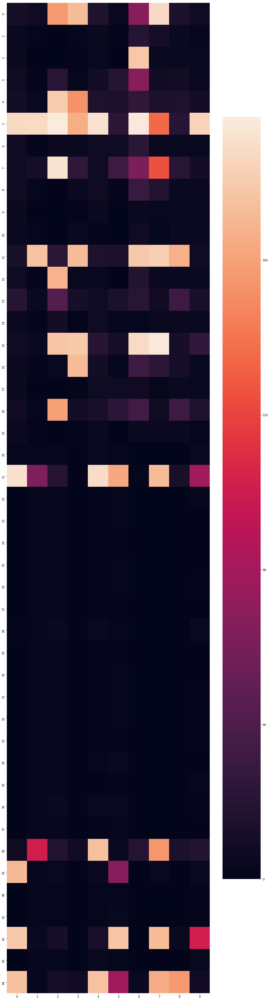

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt

model_fail_cnts = []
for i in range(0, 45):
    fail_cnts = []
    for model in tme_history:
        fail_cnts.append(model.fail_cmp_stats[i])
    model_fail_cnts.append(fail_cnts)

plt.figure(figsize=(16, 64))
sns.heatmap(model_fail_cnts)

44 0.8665208402276039


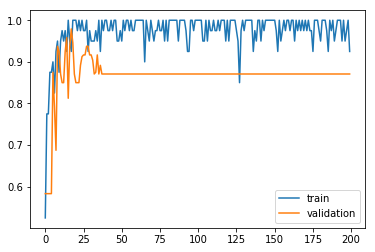

44 0.9300208579003811


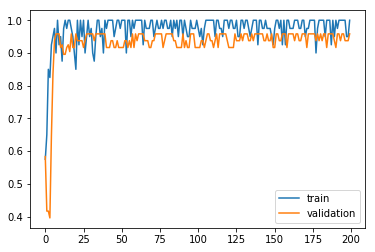

44 0.8451250213384628


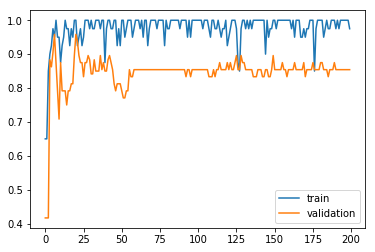

44 0.8827083453536033


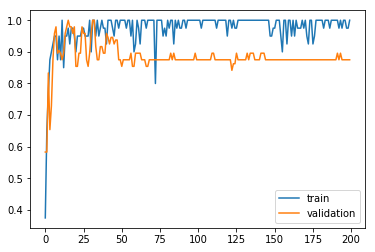

44 0.8864583659172058


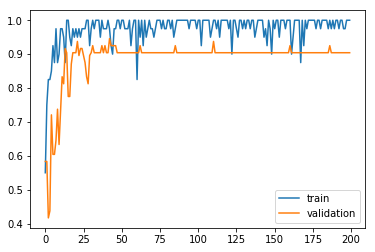

44 0.9072916975617409


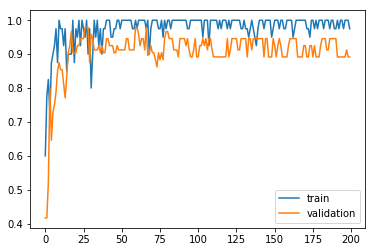

44 0.875208355486393


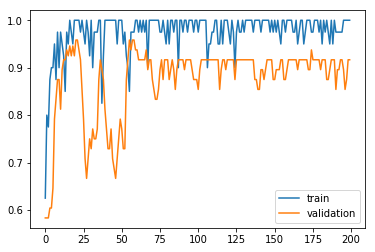

44 0.8101875123381614


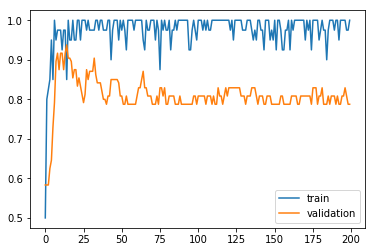

44 0.9298750451207161


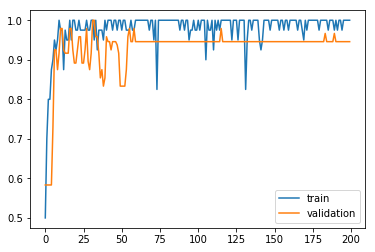

44 0.9325208738446236


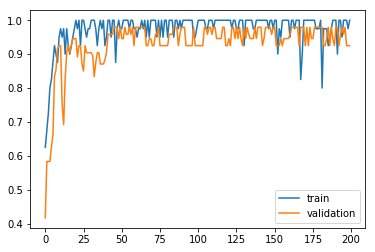

In [30]:
for th in tme_history:
    print(i, np.mean(th.val_ac_history))
    plt.plot(th.train_ac_history, label='train')
    plt.plot(th.val_ac_history, label='validation')
    plt.legend()
    plt.show()
    plt.pause(.001)
    

In [0]:
top_model = tme_history[0]
if len(tme_history) > 1:
    for tm in tme_history[1:]:
        if np.mean(tm.val_ac_history) > np.mean(top_model.val_ac_history):
            top_model = tm
model = top_model.model
    

rm: cannot remove 'submission.csv': No such file or directory






  0%|          | 0/15 [00:00<?, ?it/s]



  7%|▋         | 1/15 [00:02<00:37,  2.67s/it]



 13%|█▎        | 2/15 [00:03<00:28,  2.18s/it]



 20%|██        | 3/15 [00:04<00:21,  1.82s/it]



 27%|██▋       | 4/15 [00:05<00:17,  1.56s/it]



 33%|███▎      | 5/15 [00:06<00:13,  1.39s/it]



 40%|████      | 6/15 [00:07<00:11,  1.26s/it]



 47%|████▋     | 7/15 [00:08<00:09,  1.17s/it]



 53%|█████▎    | 8/15 [00:09<00:07,  1.12s/it]



 60%|██████    | 9/15 [00:10<00:06,  1.08s/it]



 67%|██████▋   | 10/15 [00:11<00:05,  1.04s/it]



 73%|███████▎  | 11/15 [00:12<00:04,  1.02s/it]



 80%|████████  | 12/15 [00:13<00:03,  1.01s/it]



 87%|████████▋ | 13/15 [00:14<00:01,  1.01it/s]



 93%|█████████▎| 14/15 [00:15<00:00,  1.02it/s]



100%|██████████| 15/15 [00:16<00:00,  1.05it/s]





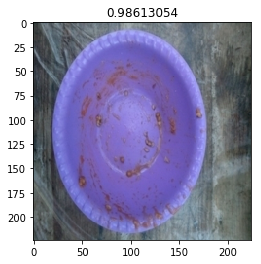

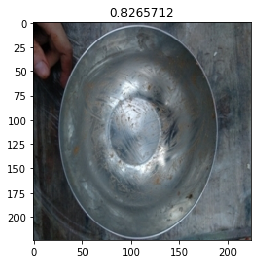

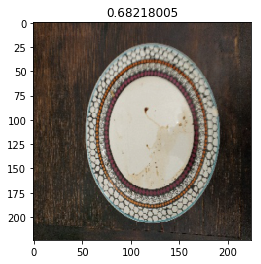

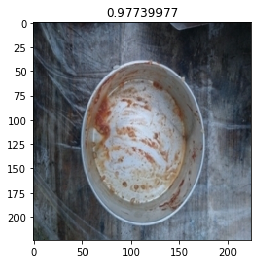

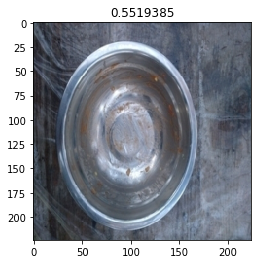

...

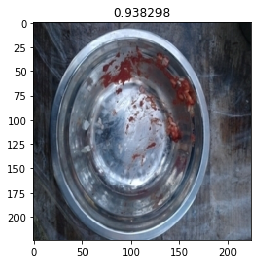

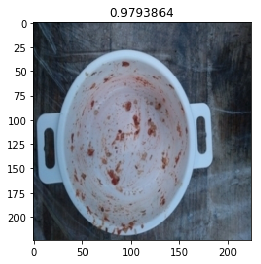

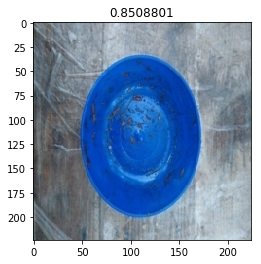

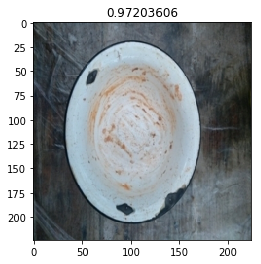

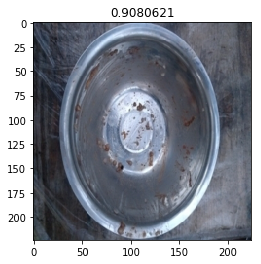

In [0]:
#%%

!rm -rf test
!rm submission.csv

test_dir = 'test'
shutil.copytree(os.path.join(data_root, 'test'), os.path.join(test_dir, 'unknown'))

class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths(test_dir, val_transforms)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=50, shuffle=False, num_workers=batch_size)

model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

inputs, labels, paths = next(iter(test_dataloader))

for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)
    
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace('test/unknown/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

submission_df.to_csv('submission.csv')

In [0]:
!ls -la

total 48
drwxr-xr-x 1 root root 4096 Jul 28 21:47 .
drwxr-xr-x 1 root root 4096 Jul 28 20:18 ..
drwxr-xr-x 1 root root 4096 Jul 19 16:14 .config
drwx------ 3 root root 4096 Jul 28 20:57 DRIVE
drwxr-xr-x 3 root root 4096 Jul 28 20:57 inputs
drwxr-xr-x 1 root root 4096 Jul 19 16:14 sample_data
-rw-r--r-- 1 root root 8653 Jul 28 21:47 submission.csv
drwxr-xr-x 3 root root 4096 Jul 28 21:47 test
drwxr-xr-x 4 root root 4096 Jul 28 21:01 train
drwxr-xr-x 4 root root 4096 Jul 28 21:01 val
